In [1]:
!gdown --id 1WFmPIGS5AceGMJRshzciS6jcwN8me4Ke

/usr/local/lib/python3.11/dist-packages/gdown/__main__.py:140: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From (original): https://drive.google.com/uc?id=1WFmPIGS5AceGMJRshzciS6jcwN8me4Ke
From (redirected): https://drive.google.com/uc?id=1WFmPIGS5AceGMJRshzciS6jcwN8me4Ke&confirm=t&uuid=ee7fca63-9345-4026-9a7e-d2a91a64cf97
To: /content/images.zip
100% 1.40G/1.40G [00:18<00:00, 77.0MB/s]


In [2]:
!gdown --id 1y4R4T7UGJy-TXCJ4nqpHUE8L7j81HgkC

/usr/local/lib/python3.11/dist-packages/gdown/__main__.py:140: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=1y4R4T7UGJy-TXCJ4nqpHUE8L7j81HgkC
To: /content/cytologia-data-1732098640162.csv
100% 1.82M/1.82M [00:00<00:00, 166MB/s]


In [3]:
import zipfile
with zipfile.ZipFile('/content/images.zip', 'r') as zip_ref:
    zip_ref.extractall('/content/Images')

In [4]:
import os
import json
import pandas as pd
from tqdm import tqdm

In [5]:
# Paths
csv_path = '/content/cytologia-data-1732098640162.csv'
images_path = '/content/Images/dataset_cytologia'

df = pd.read_csv(csv_path)

print(df.head())


             NAME   x1   y1   x2   y2 class
0  cf7734a2-b.jpg   99   88  266  276   PNN
1  e6a3b579-0.jpg   92   78  272  284    MO
2  60f95776-f.jpg  110  103  251  251    MM
3  0894e581-c.jpg  112  121  248  262   LyB
4  3998a979-3.jpg   94   86  276  281    MO


In [6]:
df['class'].nunique()

23

In [7]:
df['class'].unique()

array(['PNN', 'MO', 'MM', 'LyB', 'LGL', 'Thromb', 'LLC', 'LAM3', 'EO',
       'LY', 'BA', 'MoB', 'LM', 'LH_lyAct', 'Lysee', 'Er', 'LF', 'LZMG',
       'MBL', 'SS', 'PM', 'B', 'M'], dtype=object)

In [8]:
df.shape

(52748, 6)

In [9]:
import pandas as pd
import numpy as np
import os
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import to_categorical

## Quick Info

In [10]:
# Paths
csv_path = '/content/cytologia-data-1732098640162.csv'
images_path = '/content/Images/dataset_cytologia'

# Load CSV
df = pd.read_csv(csv_path)

# Display first few rows
print("First few rows of the dataframe:")
print(df.head())

# Display class distribution
print("\nClass distribution:")
print(df['class'].value_counts())

# Check for missing values
print("\nMissing values:")
print(df.isnull().sum())

# Check data types
print("\nData types:")
print(df.dtypes)

First few rows of the dataframe:
             NAME   x1   y1   x2   y2 class
0  cf7734a2-b.jpg   99   88  266  276   PNN
1  e6a3b579-0.jpg   92   78  272  284    MO
2  60f95776-f.jpg  110  103  251  251    MM
3  0894e581-c.jpg  112  121  248  262   LyB
4  3998a979-3.jpg   94   86  276  281    MO

Class distribution:
class
PNN         6827
Lysee       3408
LAM3        3338
LLC         3158
LyB         3029
MO          2743
MBL         2668
LGL         2439
EO          2432
Thromb      2319
Er          2308
B           2263
LF          2131
LY          2092
M           1994
MM          1707
LH_lyAct    1705
MoB         1531
PM          1152
BA          1001
LM           944
LZMG         845
SS           714
Name: count, dtype: int64

Missing values:
NAME     0
x1       0
y1       0
x2       0
y2       0
class    0
dtype: int64

Data types:
NAME     object
x1        int64
y1        int64
x2        int64
y2        int64
class    object
dtype: object


## Initial Sample visualization

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image

# Function to display image with bounding boxes
def display_image_with_boxes(df, images_path, index=0):
    row = df.iloc[index]
    image_path = f"{images_path}/{row['NAME']}"
    image = Image.open(image_path)
    fig, ax = plt.subplots(1)
    ax.imshow(image)
    # Create a Rectangle patch
    rect = patches.Rectangle((row['x1'], row['y1']), row['x2'] - row['x1'], row['y2'] - row['y1'],
                             linewidth=2, edgecolor='r', facecolor='none')
    # Add the patch to the Axes
    ax.add_patch(rect)
    plt.title(f"Class: {row['class']}")
    plt.show()

# Display the first 5 images with bounding boxes
for i in range(5):
    display_image_with_boxes(df, images_path, index=i)


In [ ]:
import seaborn as sns

plt.figure(figsize=(12, 8))
sns.countplot(y='class', data=df, order=df['class'].value_counts().index)
plt.title('Class Distribution')
plt.xlabel('Count')
plt.ylabel('Class')
plt.show()


### Duplicates

In [13]:
# Check for exact duplicate rows
exact_duplicates = df[df.duplicated()]
print(f"Number of exact duplicate rows: {exact_duplicates.shape[0]}")

if not exact_duplicates.empty:
    print("Exact duplicate rows found:")
    print(exact_duplicates.head())
else:
    print("No exact duplicate rows found.")


Number of exact duplicate rows: 0
No exact duplicate rows found.


In [14]:
# Check for duplicate bounding boxes within the same image
bbox_duplicates = df[df.duplicated(subset=['NAME', 'x1', 'y1', 'x2', 'y2', 'class'], keep=False)]
print(f"Number of duplicate bounding box entries: {bbox_duplicates.shape[0]}")

if not bbox_duplicates.empty:
    print("Duplicate bounding box entries found:")
    print(bbox_duplicates.head())
else:
    print("No duplicate bounding box entries found.")


Number of duplicate bounding box entries: 0
No duplicate bounding box entries found.


In [15]:
# Group by 'NAME', 'x1', 'y1', 'x2', 'y2'
duplicate_bboxes = (
    df.groupby(['NAME', 'x1', 'y1', 'x2', 'y2'])['class']
    .nunique()
    .reset_index()
)

# Filter groups with more than one unique class
duplicates_with_different_classes = duplicate_bboxes[duplicate_bboxes['class'] > 1]

# Merge back to the original dataframe to display the conflicting rows
conflicting_rows = pd.merge(
    df,
    duplicates_with_different_classes[['NAME', 'x1', 'y1', 'x2', 'y2']],
    on=['NAME', 'x1', 'y1', 'x2', 'y2']
)

print(f"Number of bounding boxes with multiple classes: {duplicates_with_different_classes.shape[0]}")
print("Sample conflicting rows:")
print(conflicting_rows.head())


Number of bounding boxes with multiple classes: 0
Sample conflicting rows:
Empty DataFrame
Columns: [NAME, x1, y1, x2, y2, class]
Index: []


# Number of bounding boxes inside other boxes with the same class

In [16]:
import pandas as pd
import itertools

# Function to check if box A is inside box B
def is_contained(box_a, box_b):
    return (
        box_a['x1'] >= box_b['x1'] and
        box_a['y1'] >= box_b['y1'] and
        box_a['x2'] <= box_b['x2'] and
        box_a['y2'] <= box_b['y2']
    )

# Initialize a list to store contained bounding boxes
contained_boxes_same_class = []

# Group the DataFrame by image name
grouped = df.groupby('NAME')

# Iterate through each group (each image)
for image_name, group in grouped:
    # If there's only one bounding box in the image, skip
    if len(group) < 2:
        continue

    # Iterate through all unique pairs of bounding boxes
    for (idx_a, box_a), (idx_b, box_b) in itertools.combinations(group.iterrows(), 2):
        # Check if box A is inside box B and has the same class
        if is_contained(box_a, box_b) and box_a['class'] == box_b['class']:
            contained_boxes_same_class.append({
                'Image': image_name,
                'Contained_Box_Index': idx_a,
                'Contained_Box_Coordinates': (box_a['x1'], box_a['y1'], box_a['x2'], box_a['y2']),
                'Container_Box_Index': idx_b,
                'Container_Box_Coordinates': (box_b['x1'], box_b['y1'], box_b['x2'], box_b['y2']),
                'Class': box_a['class']
            })
        # Check if box B is inside box A and has the same class
        elif is_contained(box_b, box_a) and box_b['class'] == box_a['class']:
            contained_boxes_same_class.append({
                'Image': image_name,
                'Contained_Box_Index': idx_b,
                'Contained_Box_Coordinates': (box_b['x1'], box_b['y1'], box_b['x2'], box_b['y2']),
                'Container_Box_Index': idx_a,
                'Container_Box_Coordinates': (box_a['x1'], box_a['y1'], box_a['x2'], box_a['y2']),
                'Class': box_b['class']
            })

# Convert the results to a DataFrame
contained_df_same_class = pd.DataFrame(contained_boxes_same_class)

# Display results
print(f"Number of bounding boxes inside other boxes with the same class: {contained_df_same_class.shape[0]}")
if not contained_df_same_class.empty:
    print("Sample contained boxes:")
    print(contained_df_same_class.head())


Number of bounding boxes inside other boxes with the same class: 3
Sample contained boxes:
            Image  Contained_Box_Index Contained_Box_Coordinates  \
0  069bced3-7.jpg                40268      (304, 187, 359, 281)   
1  735f9a9c-0.jpg                17317       (91, 151, 252, 284)   
2  f0cac2a6-1.jpg                 3810      (117, 181, 287, 348)   

   Container_Box_Index Container_Box_Coordinates Class  
0                37499       (267, 64, 360, 288)   LLC  
1                17639         (68, 2, 263, 296)    EO  
2                24795         (55, 8, 379, 348)   MoB  


In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image

def visualize_contained_boxes_same_class(contained_df_same_class, df, images_path, num_samples=5):
    """
    Visualize bounding boxes that are contained within other bounding boxes with the same class.

    Parameters:
    - contained_df_same_class: DataFrame with contained bounding boxes.
    - df: Original DataFrame with bounding box data.
    - images_path: Path to the directory containing images.
    - num_samples: Number of samples to visualize.
    """
    # Randomly select a subset of contained bounding boxes to visualize
    samples = contained_df_same_class.sample(n=min(num_samples, len(contained_df_same_class)), random_state=42)

    for _, row in samples.iterrows():
        image_name = row['Image']
        contained_idx = row['Contained_Box_Index']
        container_idx = row['Container_Box_Index']

        # Retrieve bounding box details
        contained_box = df.loc[contained_idx]
        container_box = df.loc[container_idx]

        # Load the image
        image_path = f"{images_path}/{image_name}"
        try:
            image = Image.open(image_path)
        except FileNotFoundError:
            print(f"Image not found: {image_path}")
            continue

        fig, ax = plt.subplots(1, figsize=(10, 10))
        ax.imshow(image)

        # Draw the container bounding box in blue
        rect_container = patches.Rectangle(
            (container_box['x1'], container_box['y1']),
            container_box['x2'] - container_box['x1'],
            container_box['y2'] - container_box['y1'],
            linewidth=2,
            edgecolor='blue',
            facecolor='none',
            label=f"Container: {container_box['class']}"
        )
        ax.add_patch(rect_container)

        # Draw the contained bounding box in red
        rect_contained = patches.Rectangle(
            (contained_box['x1'], contained_box['y1']),
            contained_box['x2'] - contained_box['x1'],
            contained_box['y2'] - contained_box['y1'],
            linewidth=2,
            edgecolor='red',
            facecolor='none',
            label=f"Contained: {contained_box['class']}"
        )
        ax.add_patch(rect_contained)

        # Annotate class labels
        ax.text(
            container_box['x1'], container_box['y1'] - 10,
            f"{container_box['class']} (Container)",
            color='blue', fontsize=12, fontweight='bold'
        )
        ax.text(
            contained_box['x1'], contained_box['y1'] - 10,
            f"{contained_box['class']} (Contained)",
            color='red', fontsize=12, fontweight='bold'
        )

        # Add legend
        plt.legend(loc="upper left")
        plt.title(f"Image: {image_name}\nContained: {contained_box['class']} | Container: {container_box['class']}")
        plt.axis('off')
        plt.show()

# Visualize up to 5 contained bounding boxes
if contained_df_same_class.empty:
    print("No contained bounding boxes with the same class to visualize.")
else:
    visualize_contained_boxes_same_class(contained_df_same_class, df, images_path, num_samples=5)


### Same bounding box different class

In [18]:
import pandas as pd
import itertools

# Function to check if two boxes have identical coordinates
def is_identical(box_a, box_b):
    return (
        box_a['x1'] == box_b['x1'] and
        box_a['y1'] == box_b['y1'] and
        box_a['x2'] == box_b['x2'] and
        box_a['y2'] == box_b['y2']
    )

# Initialize a list to store boxes with identical coordinates but different classes
identical_diff_class_boxes = []

# Group the DataFrame by image name
grouped = df.groupby('NAME')

# Iterate through each group (each image)
for image_name, group in grouped:
    # If there's only one bounding box in the image, skip
    if len(group) < 2:
        continue

    # Iterate through all unique pairs of bounding boxes
    for (idx_a, box_a), (idx_b, box_b) in itertools.combinations(group.iterrows(), 2):
        if is_identical(box_a, box_b):
            if box_a['class'] != box_b['class']:
                identical_diff_class_boxes.append({
                    'Image': image_name,
                    'Box_A_Index': idx_a,
                    'Box_A_Coordinates': (box_a['x1'], box_a['y1'], box_a['x2'], box_a['y2']),
                    'Box_A_Class': box_a['class'],
                    'Box_B_Index': idx_b,
                    'Box_B_Coordinates': (box_b['x1'], box_b['y1'], box_b['x2'], box_b['y2']),
                    'Box_B_Class': box_b['class']
                })

# Convert the results to a DataFrame
identical_diff_class_df = pd.DataFrame(identical_diff_class_boxes)

# Display results
print(f"Number of bounding boxes with identical coordinates but different classes: {identical_diff_class_df.shape[0]}")
if not identical_diff_class_df.empty:
    print("\nSample identical boxes with different classes:")
    print(identical_diff_class_df.head())


Number of bounding boxes with identical coordinates but different classes: 0


# Number of overlapping bounding box pairs

In [19]:
import pandas as pd
import itertools

# Function to calculate Intersection over Union (IoU)
def calculate_iou(box_a, box_b):
    # Check for invalid boxes
    if box_a['x2'] <= box_a['x1'] or box_a['y2'] <= box_a['y1']:
        return 0
    if box_b['x2'] <= box_b['x1'] or box_b['y2'] <= box_b['y1']:
        return 0

    # Coordinates of the intersection rectangle
    x1 = max(box_a['x1'], box_b['x1'])
    y1 = max(box_a['y1'], box_b['y1'])
    x2 = min(box_a['x2'], box_b['x2'])
    y2 = min(box_a['y2'], box_b['y2'])

    # Calculate intersection area
    intersection_area = max(0, x2 - x1) * max(0, y2 - y1)

    # Calculate areas of each box
    area_a = (box_a['x2'] - box_a['x1']) * (box_a['y2'] - box_a['y1'])
    area_b = (box_b['x2'] - box_b['x1']) * (box_b['y2'] - box_b['y1'])

    # Calculate union area
    union_area = area_a + area_b - intersection_area

    # Calculate IoU
    iou = intersection_area / union_area if union_area > 0 else 0
    return iou

# Ensure the DataFrame has required columns
required_columns = {'NAME', 'x1', 'y1', 'x2', 'y2'}
if not required_columns.issubset(df.columns):
    raise ValueError(f"DataFrame is missing one or more required columns: {required_columns - set(df.columns)}")

# Initialize a counter for overlapping boxes and a list to store overlap details
overlap_count = 0
overlaps = []

# Group the DataFrame by image name
grouped = df.groupby('NAME')

# Threshold for overlap (IoU > 0 means any overlap)
iou_threshold = 0.0

# Iterate through each group (each image)
for image_name, group in grouped:
    if len(group) < 2:
        continue  # Skip images with fewer than 2 bounding boxes

    # Iterate through all unique pairs of bounding boxes
    for (idx_a, box_a), (idx_b, box_b) in itertools.combinations(group.iterrows(), 2):
        iou = calculate_iou(box_a, box_b)
        if iou > iou_threshold:
            overlap_count += 1
            overlaps.append((image_name, idx_a, idx_b, iou))

print(f"Number of overlapping bounding box pairs: {overlap_count}")

# Display sample overlap details
if overlaps:
    print("Sample overlaps:")
    for sample in overlaps[:5]:  # Show the first 5 overlaps
        print(f"Image: {sample[0]}, Box A Index: {sample[1]}, Box B Index: {sample[2]}, IoU: {sample[3]:.2f}")


Number of overlapping bounding box pairs: 2691
Sample overlaps:
Image: 005295fa-e.jpg, Box A Index: 5272, Box B Index: 13789, IoU: 0.01
Image: 007079b5-e.jpg, Box A Index: 27291, Box B Index: 35056, IoU: 0.06
Image: 007079b5-e.jpg, Box A Index: 27291, Box B Index: 40705, IoU: 0.04
Image: 007079b5-e.jpg, Box A Index: 40705, Box B Index: 46503, IoU: 0.00
Image: 00947c65-8.jpg, Box A Index: 9521, Box B Index: 11180, IoU: 0.06


Total overlapping pairs: 2691


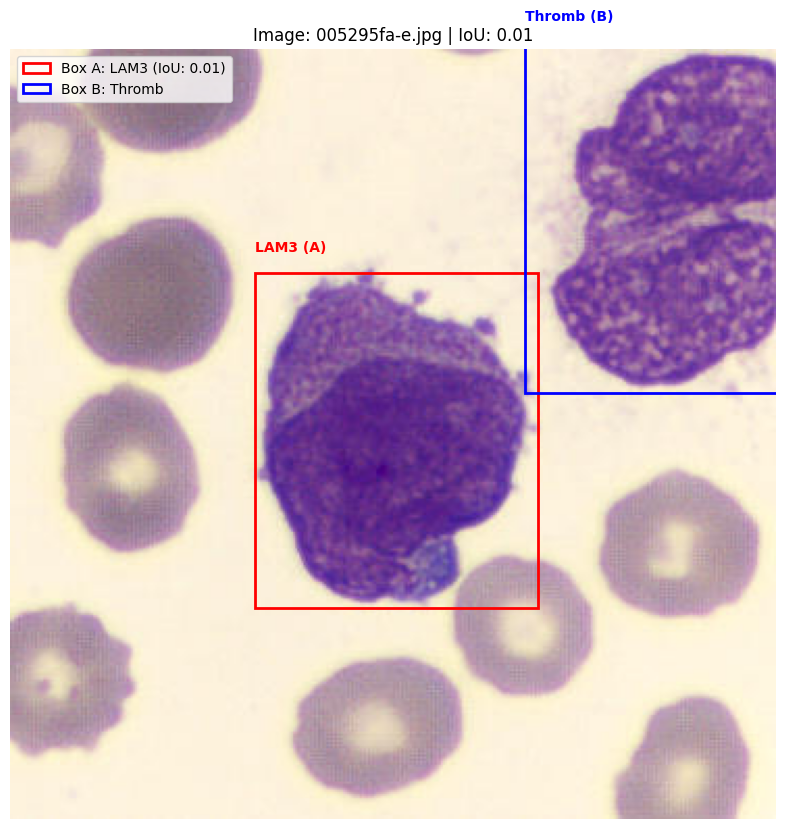

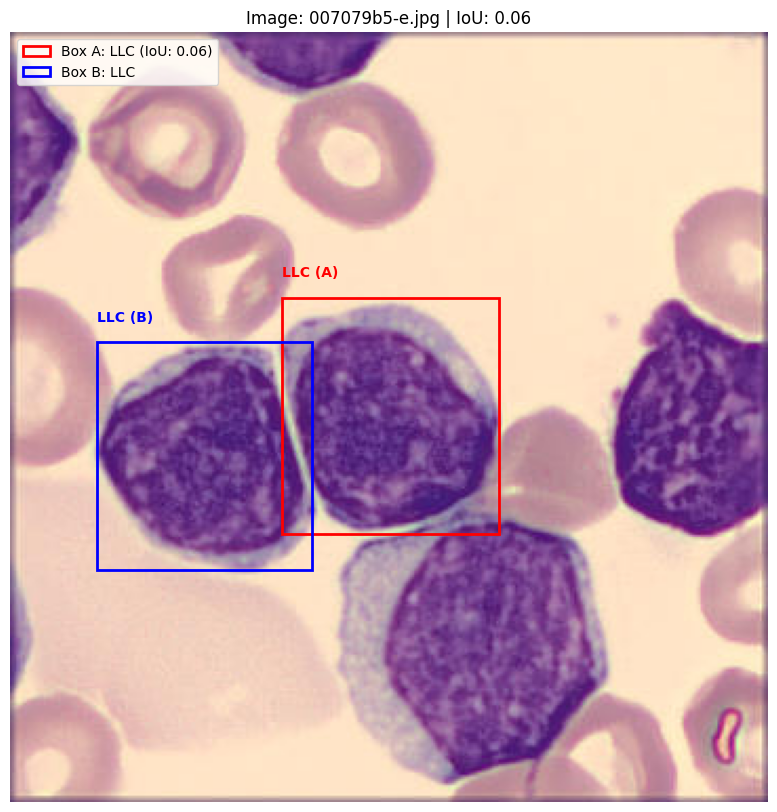

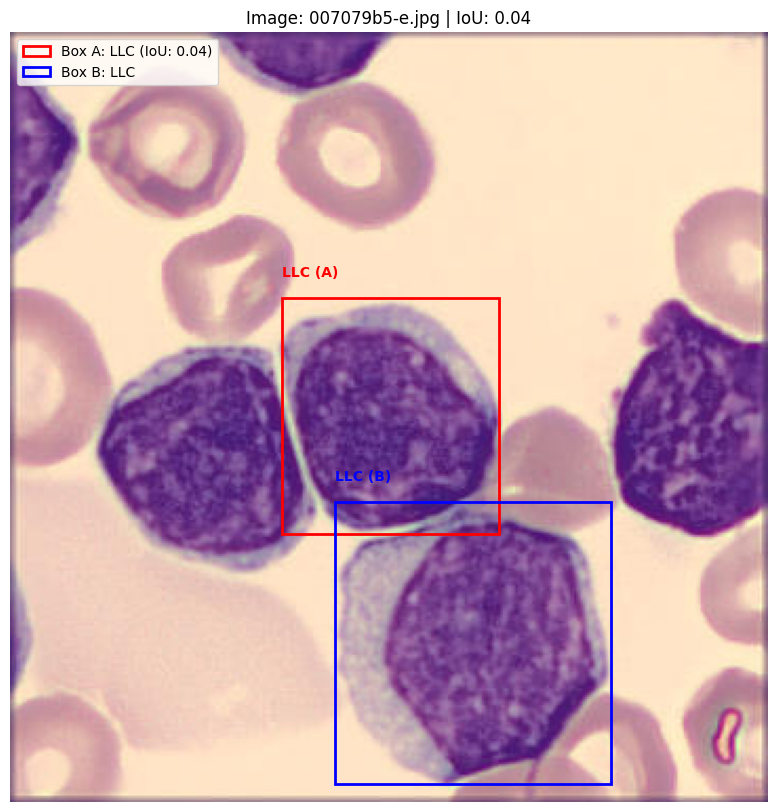

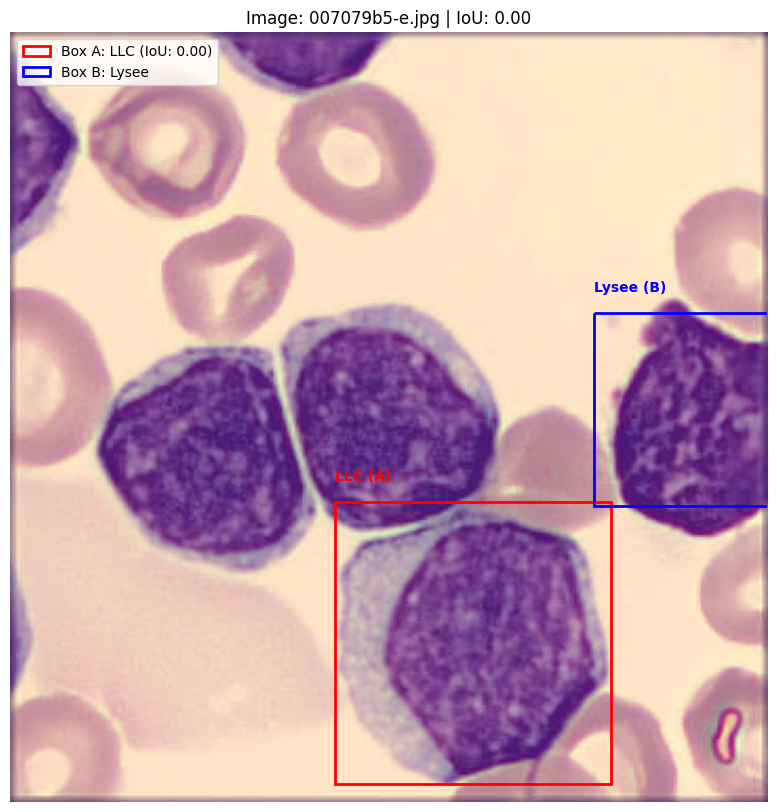

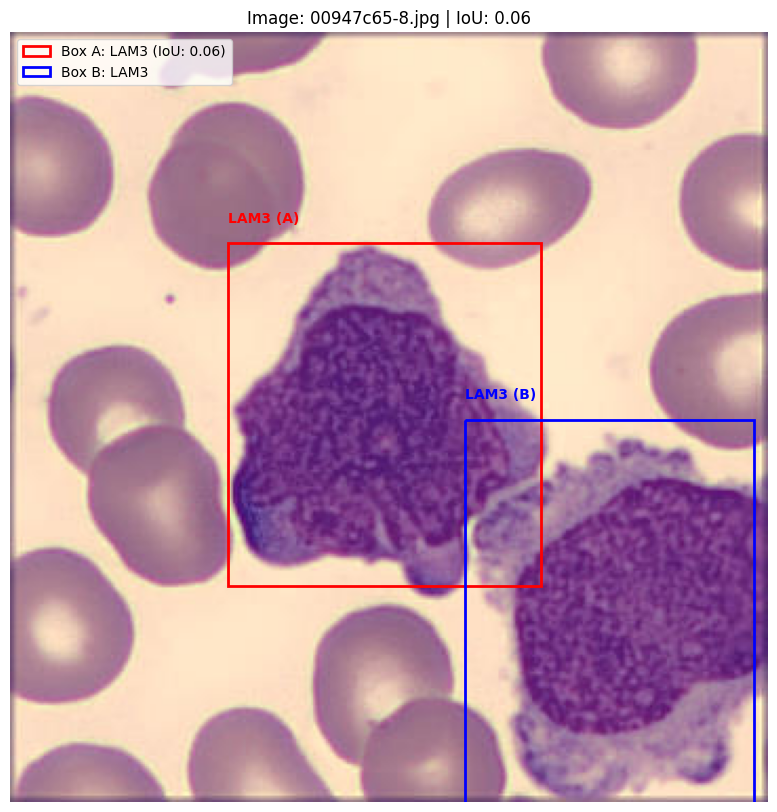

In [20]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image

import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image

def debug_visualization_from_overlaps(overlaps, df, images_path, num_samples=5):
    """
    Visualize overlapping bounding boxes using precomputed overlaps, including class labels.

    Parameters:
    - overlaps: List of precomputed overlaps (image_name, box_a_index, box_b_index, iou).
    - df: Original DataFrame containing bounding box data.
    - images_path: Path to the directory containing images.
    - num_samples: Number of overlaps to visualize.
    """
    if not overlaps:
        print("No overlapping boxes found.")
        return

    print(f"Total overlapping pairs: {len(overlaps)}")

    # Visualize up to num_samples overlaps
    for sample in overlaps[:num_samples]:
        image_name, idx_a, idx_b, iou = sample
        image_path = f"{images_path}/{image_name}"

        try:
            # Load the image
            image = Image.open(image_path)
        except FileNotFoundError:
            print(f"Image not found: {image_path}")
            continue

        # Retrieve the bounding boxes
        box_a = df.iloc[idx_a]
        box_b = df.iloc[idx_b]

        fig, ax = plt.subplots(1, figsize=(10, 10))
        ax.imshow(image)

        # Draw bounding box A
        rect_a = patches.Rectangle(
            (box_a['x1'], box_a['y1']),
            box_a['x2'] - box_a['x1'],
            box_a['y2'] - box_a['y1'],
            linewidth=2,
            edgecolor='red',
            facecolor='none',
            label=f"Box A: {box_a['class']} (IoU: {iou:.2f})"
        )
        ax.add_patch(rect_a)
        # Annotate class label for Box A
        ax.text(
            box_a['x1'], box_a['y1'] - 10,
            f"{box_a['class']} (A)",
            color='red', fontsize=10, fontweight='bold'
        )

        # Draw bounding box B
        rect_b = patches.Rectangle(
            (box_b['x1'], box_b['y1']),
            box_b['x2'] - box_b['x1'],
            box_b['y2'] - box_b['y1'],
            linewidth=2,
            edgecolor='blue',
            facecolor='none',
            label=f"Box B: {box_b['class']}"
        )
        ax.add_patch(rect_b)
        # Annotate class label for Box B
        ax.text(
            box_b['x1'], box_b['y1'] - 10,
            f"{box_b['class']} (B)",
            color='blue', fontsize=10, fontweight='bold'
        )

        # Add legend and title
        plt.legend(loc="upper left")
        plt.title(f"Image: {image_name} | IoU: {iou:.2f}")
        plt.axis('off')
        plt.show()



# Debug visualization
debug_visualization_from_overlaps(overlaps, df, images_path, num_samples=5)


#  Count the number of images with out-of-bound bounding boxes.

In [21]:
from PIL import Image

def count_images_with_out_of_bound_boxes(df, images_path):
    """
    Count the number of images with out-of-bound bounding boxes.

    Parameters:
    - df: DataFrame containing bounding box data with columns ['NAME', 'x1', 'y1', 'x2', 'y2'].
    - images_path: Path to the directory containing images.

    Returns:
    - count: Number of images with out-of-bound bounding boxes.
    - out_of_bound_details: List of details for out-of-bound bounding boxes.
    """
    out_of_bound_images = set()
    out_of_bound_details = []

    for image_name, group in df.groupby('NAME'):
        image_path = f"{images_path}/{image_name}"
        try:
            # Load the image to get its dimensions
            with Image.open(image_path) as img:
                width, height = img.size
        except FileNotFoundError:
            print(f"Image not found: {image_path}")
            continue

        # Check bounding boxes for this image
        for _, row in group.iterrows():
            if (
                row['x1'] < 0 or row['y1'] < 0 or
                row['x2'] > width or row['y2'] > height
            ):
                # Add image to the out-of-bound set
                out_of_bound_images.add(image_name)
                # Store the details of the out-of-bound bounding box
                out_of_bound_details.append({
                    'Image': image_name,
                    'x1': row['x1'], 'y1': row['y1'],
                    'x2': row['x2'], 'y2': row['y2'],
                    'Width': width, 'Height': height
                })

    return len(out_of_bound_images), out_of_bound_details

# Count images with out-of-bound bounding boxes
num_out_of_bound_images, out_of_bound_details = count_images_with_out_of_bound_boxes(df, images_path)

print(f"Number of images with out-of-bound bounding boxes: {num_out_of_bound_images}")

# Display a sample of out-of-bound bounding boxes
if out_of_bound_details:
    print("\nSample out-of-bound bounding boxes:")
    for detail in out_of_bound_details[:5]:  # Show the first 5 for brevity
        print(detail)


Number of images with out-of-bound bounding boxes: 668

Sample out-of-bound bounding boxes:
{'Image': '005295fa-e.jpg', 'x1': 247, 'y1': -4, 'x2': 373, 'y2': 165, 'Width': 368, 'Height': 370}
{'Image': '007079b5-e.jpg', 'x1': 277, 'y1': 133, 'x2': 367, 'y2': 225, 'Width': 360, 'Height': 366}
{'Image': '00947c65-8.jpg', 'x1': 216, 'y1': 184, 'x2': 353, 'y2': 375, 'Width': 360, 'Height': 366}
{'Image': '00a10b20-b.jpg', 'x1': 36, 'y1': 275, 'x2': 176, 'y2': 408, 'Width': 360, 'Height': 366}
{'Image': '00eb7104-0.jpg', 'x1': -13, 'y1': 268, 'x2': 89, 'y2': 374, 'Width': 368, 'Height': 369}


### Adjust these images

In [22]:
def adjust_bounding_boxes(df, images_path):
    """
    Adjust bounding box coordinates to ensure they are within the image borders.

    Parameters:
    - df: DataFrame containing bounding box data with columns ['NAME', 'x1', 'y1', 'x2', 'y2'].
    - images_path: Path to the directory containing images.

    Returns:
    - adjusted_df: DataFrame with adjusted bounding boxes and a 'fixed_border' column.
    - adjusted_details: List of details for bounding boxes that were adjusted.
    """
    adjusted_details = []

    # Make a copy of the DataFrame to avoid modifying the original
    adjusted_df = df.copy()

    # Add 'fixed_border' column
    adjusted_df['fixed_border'] = False

    for image_name, group in df.groupby('NAME'):
        image_path = f"{images_path}/{image_name}"
        try:
            # Load the image to get its dimensions
            with Image.open(image_path) as img:
                width, height = img.size
        except FileNotFoundError:
            print(f"Image not found: {image_path}")
            continue

        # Adjust bounding boxes for this image
        for idx, row in group.iterrows():
            original_box = row[['x1', 'y1', 'x2', 'y2']].to_dict()
            adjusted_box = {
                'x1': max(0, min(row['x1'], width)),
                'y1': max(0, min(row['y1'], height)),
                'x2': max(0, min(row['x2'], width)),
                'y2': max(0, min(row['y2'], height))
            }

            # Check if the box was adjusted
            if original_box != adjusted_box:
                adjusted_details.append({
                    'Image': image_name,
                    'Original_Box': original_box,
                    'Adjusted_Box': adjusted_box
                })
                # Update the DataFrame with adjusted coordinates
                adjusted_df.at[idx, 'x1'] = adjusted_box['x1']
                adjusted_df.at[idx, 'y1'] = adjusted_box['y1']
                adjusted_df.at[idx, 'x2'] = adjusted_box['x2']
                adjusted_df.at[idx, 'y2'] = adjusted_box['y2']

                # Mark as fixed
                adjusted_df.at[idx, 'fixed_border'] = True

    return adjusted_df, adjusted_details


# Fix bounding boxes
adjusted_df, adjusted_details = adjust_bounding_boxes(df, images_path)

#Save the adjusted DataFrame for future reference
adjusted_df.to_csv('adjusted_bounding_boxes.csv', index=False)

print(f"Number of bounding boxes adjusted: {len(adjusted_details)}")
if adjusted_details:
    print("\nSample adjusted bounding boxes:")
    for detail in adjusted_details[:5]:
        print(detail)


Number of bounding boxes adjusted: 722

Sample adjusted bounding boxes:
{'Image': '005295fa-e.jpg', 'Original_Box': {'x1': 247, 'y1': -4, 'x2': 373, 'y2': 165}, 'Adjusted_Box': {'x1': 247, 'y1': 0, 'x2': 368, 'y2': 165}}
{'Image': '007079b5-e.jpg', 'Original_Box': {'x1': 277, 'y1': 133, 'x2': 367, 'y2': 225}, 'Adjusted_Box': {'x1': 277, 'y1': 133, 'x2': 360, 'y2': 225}}
{'Image': '00947c65-8.jpg', 'Original_Box': {'x1': 216, 'y1': 184, 'x2': 353, 'y2': 375}, 'Adjusted_Box': {'x1': 216, 'y1': 184, 'x2': 353, 'y2': 366}}
{'Image': '00a10b20-b.jpg', 'Original_Box': {'x1': 36, 'y1': 275, 'x2': 176, 'y2': 408}, 'Adjusted_Box': {'x1': 36, 'y1': 275, 'x2': 176, 'y2': 366}}
{'Image': '00eb7104-0.jpg', 'Original_Box': {'x1': -13, 'y1': 268, 'x2': 89, 'y2': 374}, 'Adjusted_Box': {'x1': 0, 'y1': 268, 'x2': 89, 'y2': 369}}


In [23]:
# Recheck for out-of-bound bounding boxes in the adjusted DataFrame
num_out_of_bound_images, out_of_bound_details = count_images_with_out_of_bound_boxes(adjusted_df, images_path)

print(f"Number of images with out-of-bound bounding boxes (after adjustment): {num_out_of_bound_images}")

# Display a sample of out-of-bound bounding boxes (if any, which shouldn't be the case)
if out_of_bound_details:
    print("\nSample out-of-bound bounding boxes (after adjustment):")
    for detail in out_of_bound_details[:5]:  # Show the first 5 for brevity
        print(detail)
else:
    print("No out-of-bound bounding boxes found in the adjusted dataset.")


Number of images with out-of-bound bounding boxes (after adjustment): 0
No out-of-bound bounding boxes found in the adjusted dataset.


 # identify cases where bounding boxes are overlapping or very near each other (indicating potential duplicate detections or closely located objects),

In [24]:
from itertools import combinations

In [25]:
# Import required module
from itertools import combinations

# Ensure the necessary columns are present
required_columns = {'NAME', 'class', 'x1', 'y1', 'x2', 'y2'}
if not required_columns.issubset(adjusted_df.columns):
    raise ValueError(f"DataFrame must contain the following columns: {required_columns}")

# Function to calculate Intersection over Union (IoU) between two boxes
def calculate_iou(box1, box2):
    x1_min, y1_min, x1_max, y1_max = box1
    x2_min, y2_min, x2_max, y2_max = box2

    inter_min_x = max(x1_min, x2_min)
    inter_min_y = max(y1_min, y2_min)
    inter_max_x = min(x1_max, x2_max)
    inter_max_y = min(y1_max, y2_max)

    inter_width = max(0, inter_max_x - inter_min_x)
    inter_height = max(0, inter_max_y - inter_min_y)
    inter_area = inter_width * inter_height

    area_box1 = (x1_max - x1_min) * (y1_max - y1_min)
    area_box2 = (x2_max - x2_min) * (y2_max - y2_min)

    union_area = area_box1 + area_box2 - inter_area
    return inter_area / union_area if union_area > 0 else 0

# Function to calculate the minimum distance between two boxes
def calculate_min_distance(box1, box2):
    x1_min, y1_min, x1_max, y1_max = box1
    x2_min, y2_min, x2_max, y2_max = box2

    if (x1_max >= x2_min and x2_max >= x1_min and
        y1_max >= y2_min and y2_max >= y1_min):
        return 0

    dx = max(x2_min - x1_max, x1_min - x2_max, 0)
    dy = max(y2_min - y1_max, y1_min - y2_max, 0)

    return (dx**2 + dy**2) ** 0.5

# Parameters for proximity
IOU_THRESHOLD = 0.3
DISTANCE_THRESHOLD = 50

# Lists to store overlapping and nearby bounding boxes
overlaps_same_class = []
overlaps_diff_class = []
proximities_same_class = []
proximities_diff_class = []

# Iterate through each image
for image_name, group in adjusted_df.groupby('NAME'):
    boxes = group[['x1', 'y1', 'x2', 'y2']].values
    classes = group['class'].values
    indices = group.index.tolist()

    # Iterate through all unique pairs of boxes in the image
    for (i, box1, class1), (j, box2, class2) in combinations(zip(indices, boxes, classes), 2):
        iou = calculate_iou(box1, box2)
        distance = calculate_min_distance(box1, box2)

        same_class = class1 == class2

        if iou > IOU_THRESHOLD:
            if same_class:
                overlaps_same_class.append({
                    'Image': image_name,
                    'Box1_Index': i,
                    'Box2_Index': j,
                    'Class': class1,
                    'IoU': iou
                })
            else:
                overlaps_diff_class.append({
                    'Image': image_name,
                    'Box1_Index': i,
                    'Box2_Index': j,
                    'Class1': class1,
                    'Class2': class2,
                    'IoU': iou
                })
        elif distance < DISTANCE_THRESHOLD:
            if same_class:
                proximities_same_class.append({
                    'Image': image_name,
                    'Box1_Index': i,
                    'Box2_Index': j,
                    'Class': class1,
                    'Distance': distance
                })
            else:
                proximities_diff_class.append({
                    'Image': image_name,
                    'Box1_Index': i,
                    'Box2_Index': j,
                    'Class1': class1,
                    'Class2': class2,
                    'Distance': distance
                })

# Convert lists to DataFrames for better visualization
df_overlaps_same = pd.DataFrame(overlaps_same_class)
df_overlaps_diff = pd.DataFrame(overlaps_diff_class)
df_proximities_same = pd.DataFrame(proximities_same_class)
df_proximities_diff = pd.DataFrame(proximities_diff_class)

# Display the results
print(f"Total overlapping bounding boxes (Same Class): {len(df_overlaps_same)}")
print(f"Total overlapping bounding boxes (Different Classes): {len(df_overlaps_diff)}")
print(f"Total nearby bounding boxes (Same Class): {len(df_proximities_same)}")
print(f"Total nearby bounding boxes (Different Classes): {len(df_proximities_diff)}")


Total overlapping bounding boxes (Same Class): 11
Total overlapping bounding boxes (Different Classes): 5
Total nearby bounding boxes (Same Class): 3548
Total nearby bounding boxes (Different Classes): 1229


In [26]:
from PIL import Image, ImageDraw

In [ ]:
# Visualization function with class display
def visualize_cases(df, case_type, adjusted_df, images_path, sample_size=3):
    if df.empty:
        print(f"No {case_type} cases to display.")
        return

    sample_cases = df.sample(n=min(sample_size, len(df)), random_state=42)

    for _, row in sample_cases.iterrows():
        image_name = row['Image']
        image_path = os.path.join(images_path, image_name)

        try:
            with Image.open(image_path) as img:
                draw = ImageDraw.Draw(img)

                # Fetch first bounding box coordinates and class
                box1_row = adjusted_df.loc[row['Box1_Index']]
                box1 = [box1_row['x1'], box1_row['y1'], box1_row['x2'], box1_row['y2']]
                class1 = box1_row['class']

                # Fetch second bounding box coordinates and class
                box2_row = adjusted_df.loc[row['Box2_Index']]
                box2 = [box2_row['x1'], box2_row['y1'], box2_row['x2'], box2_row['y2']]
                class2 = box2_row['class']

                # Draw the bounding boxes
                draw.rectangle(box1, outline="red", width=2)
                draw.rectangle(box2, outline="blue", width=2)

                # Annotate the class labels
                draw.text((box1[0], box1[1] - 10), str(class1), fill="red")
                draw.text((box2[0], box2[1] - 10), str(class2), fill="blue")

                # Display the image with bounding boxes
                plt.figure(figsize=(8, 8))
                plt.imshow(img)
                plt.title(f"{case_type} - {image_name}")
                plt.axis('off')
                plt.show()
        except FileNotFoundError:
            print(f"Image not found: {image_path}")
        except KeyError as e:
            print(f"KeyError: {e} for image {image_name}")

# Visualize some same class overlaps and proximities
visualize_cases(df_overlaps_same, "Overlap - Same Class", adjusted_df, images_path)
visualize_cases(df_proximities_same, "Proximity - Same Class", adjusted_df, images_path)

# Visualize some different class overlaps and proximities
visualize_cases(df_overlaps_diff, "Overlap - Different Classes", adjusted_df, images_path)
visualize_cases(df_proximities_diff, "Proximity - Different Classes", adjusted_df, images_path)


In [28]:
# Import required modules
import pandas as pd

# Ensure the necessary columns are present
required_columns = {'NAME', 'class', 'x1', 'y1', 'x2', 'y2'}
if not required_columns.issubset(adjusted_df.columns):
    raise ValueError(f"DataFrame must contain the following columns: {required_columns}")

# Function to calculate Intersection over Union (IoU) between two boxes
def calculate_iou(box1, box2):
    x1_min, y1_min, x1_max, y1_max = box1
    x2_min, y2_min, x2_max, y2_max = box2

    inter_min_x = max(x1_min, x2_min)
    inter_min_y = max(y1_min, y2_min)
    inter_max_x = min(x1_max, x2_max)
    inter_max_y = min(y1_max, y2_max)

    inter_width = max(0, inter_max_x - inter_min_x)
    inter_height = max(0, inter_max_y - inter_min_y)
    inter_area = inter_width * inter_height

    area_box1 = (x1_max - x1_min) * (y1_max - y1_min)
    area_box2 = (x2_max - x2_min) * (y2_max - y2_min)

    union_area = area_box1 + area_box2 - inter_area
    return inter_area / union_area if union_area > 0 else 0

# Parameters for proximity
IOU_THRESHOLD = 0.3
DISTANCE_THRESHOLD = 50

# Store indices of rows to drop
indices_to_drop = set()

# Iterate through each image
for image_name, group in adjusted_df.groupby('NAME'):
    boxes = group[['x1', 'y1', 'x2', 'y2']].values
    classes = group['class'].values
    indices = group.index.tolist()

    # Iterate through all unique pairs of boxes in the image
    for (i, box1, class1), (j, box2, class2) in combinations(zip(indices, boxes, classes), 2):
        iou = calculate_iou(box1, box2)
        if iou > IOU_THRESHOLD:
            if class1 == class2:
                area_box1 = (box1[2] - box1[0]) * (box1[3] - box1[1])
                area_box2 = (box2[2] - box2[0]) * (box2[3] - box2[1])
                if area_box1 > area_box2:
                    indices_to_drop.add(j)
                else:
                    indices_to_drop.add(i)
            else:
                indices_to_drop.update(group.index)

# Drop the indices from the DataFrame
adjusted_df.drop(indices_to_drop, inplace=True)

# Save the cleaned DataFrame
adjusted_df.to_csv("cleaned_data.csv", index=False)

# Display information about removed data
print(f"Total bounding boxes removed: {len(indices_to_drop)}")

Total bounding boxes removed: 25


In [29]:
adjusted_df = pd.read_csv('cleaned_data.csv')

In [30]:
# Reinitialize lists to store overlaps and proximities
overlaps_same_class = []
overlaps_diff_class = []
proximities_same_class = []
proximities_diff_class = []

# Iterate through each image in the cleaned DataFrame
for image_name, group in adjusted_df.groupby('NAME'):
    boxes = group[['x1', 'y1', 'x2', 'y2']].values
    classes = group['class'].values
    indices = group.index.tolist()

    # Iterate through all unique pairs of boxes in the image
    for (i, box1, class1), (j, box2, class2) in combinations(zip(indices, boxes, classes), 2):
        iou = calculate_iou(box1, box2)
        distance = calculate_min_distance(box1, box2)

        same_class = class1 == class2

        if iou > IOU_THRESHOLD:
            if same_class:
                overlaps_same_class.append({
                    'Image': image_name,
                    'Box1_Index': i,
                    'Box2_Index': j,
                    'Class': class1,
                    'IoU': iou
                })
            else:
                overlaps_diff_class.append({
                    'Image': image_name,
                    'Box1_Index': i,
                    'Box2_Index': j,
                    'Class1': class1,
                    'Class2': class2,
                    'IoU': iou
                })
        elif distance < DISTANCE_THRESHOLD:
            if same_class:
                proximities_same_class.append({
                    'Image': image_name,
                    'Box1_Index': i,
                    'Box2_Index': j,
                    'Class': class1,
                    'Distance': distance
                })
            else:
                proximities_diff_class.append({
                    'Image': image_name,
                    'Box1_Index': i,
                    'Box2_Index': j,
                    'Class1': class1,
                    'Class2': class2,
                    'Distance': distance
                })

# Convert lists to DataFrames for better visualization
df_overlaps_same_cleaned = pd.DataFrame(overlaps_same_class)
df_overlaps_diff_cleaned = pd.DataFrame(overlaps_diff_class)
df_proximities_same_cleaned = pd.DataFrame(proximities_same_class)
df_proximities_diff_cleaned = pd.DataFrame(proximities_diff_class)

# Display the updated results
print("\nAfter Dropping:")
print(f"Total overlapping bounding boxes (Same Class): {len(df_overlaps_same_cleaned)}")
print(f"Total overlapping bounding boxes (Different Classes): {len(df_overlaps_diff_cleaned)}")
print(f"Total nearby bounding boxes (Same Class): {len(df_proximities_same_cleaned)}")
print(f"Total nearby bounding boxes (Different Classes): {len(df_proximities_diff_cleaned)}")



After Dropping:
Total overlapping bounding boxes (Same Class): 0
Total overlapping bounding boxes (Different Classes): 0
Total nearby bounding boxes (Same Class): 3539
Total nearby bounding boxes (Different Classes): 1224


In [31]:
adjusted_df.shape

(52723, 7)

# Data Balancing

In [32]:
import pandas as pd

# Function to downsample data to approximately 600 rows per class, considering all bounding boxes per image
def downsample_to_approx_rows_per_class(df, target_rows, class_column='class', image_id_column='NAME'):
    def downsample_group(group):
        unique_images = group[image_id_column].unique()
        sampled_group = pd.DataFrame()  # Initialize empty DataFrame to hold sampled data
        np.random.shuffle(unique_images)  # Randomize the order of images

        for image_id in unique_images:
            image_rows = group[group[image_id_column] == image_id]  # Get all rows for the current image
            if len(sampled_group) + len(image_rows) <= target_rows:
                sampled_group = pd.concat([sampled_group, image_rows])  # Add rows to the sampled group
            else:
                break  # Stop adding if the target number of rows would be exceeded

        return sampled_group

    # Group by class and apply the sampling function to each group
    return df.groupby(class_column).apply(downsample_group).reset_index(drop=True)

# Assuming adjusted_df has columns 'class' and 'image_id'
sampled_df = downsample_to_approx_rows_per_class(adjusted_df, 600, 'class', 'NAME')

# Checking the sampled data
sampled_counts = sampled_df.groupby('class').size()
print(f"Sampled data count per class:\n{sampled_counts}")

# Saving the sampled DataFrame to a CSV file
sampled_df.to_csv('downsampled_data.csv', index=False)
print("Downsampled DataFrame has been saved to 'downsampled_data.csv'.")

Sampled data count per class:
class
B           599
BA          600
EO          600
Er          600
LAM3        600
LF          599
LGL         600
LH_lyAct    600
LLC         600
LM          600
LY          600
LZMG        599
LyB         600
Lysee       600
M           600
MBL         600
MM          600
MO          600
MoB         600
PM          600
PNN         600
SS          600
Thromb      600
dtype: int64
Downsampled DataFrame has been saved to 'downsampled_data.csv'.


<ipython-input-32-bc97e34a2fd3>:20: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  return df.groupby(class_column).apply(downsample_group).reset_index(drop=True)


In [33]:
# Reinitialize lists to store overlaps and proximities
overlaps_same_class = []
overlaps_diff_class = []
proximities_same_class = []
proximities_diff_class = []

# Iterate through each image in the cleaned DataFrame
for image_name, group in sampled_df.groupby('NAME'):
    boxes = group[['x1', 'y1', 'x2', 'y2']].values
    classes = group['class'].values
    indices = group.index.tolist()

    # Iterate through all unique pairs of boxes in the image
    for (i, box1, class1), (j, box2, class2) in combinations(zip(indices, boxes, classes), 2):
        iou = calculate_iou(box1, box2)
        distance = calculate_min_distance(box1, box2)

        same_class = class1 == class2

        if iou > IOU_THRESHOLD:
            if same_class:
                overlaps_same_class.append({
                    'Image': image_name,
                    'Box1_Index': i,
                    'Box2_Index': j,
                    'Class': class1,
                    'IoU': iou
                })
            else:
                overlaps_diff_class.append({
                    'Image': image_name,
                    'Box1_Index': i,
                    'Box2_Index': j,
                    'Class1': class1,
                    'Class2': class2,
                    'IoU': iou
                })
        elif distance < DISTANCE_THRESHOLD:
            if same_class:
                proximities_same_class.append({
                    'Image': image_name,
                    'Box1_Index': i,
                    'Box2_Index': j,
                    'Class': class1,
                    'Distance': distance
                })
            else:
                proximities_diff_class.append({
                    'Image': image_name,
                    'Box1_Index': i,
                    'Box2_Index': j,
                    'Class1': class1,
                    'Class2': class2,
                    'Distance': distance
                })

# Convert lists to DataFrames for better visualization
df_overlaps_same_cleaned = pd.DataFrame(overlaps_same_class)
df_overlaps_diff_cleaned = pd.DataFrame(overlaps_diff_class)
df_proximities_same_cleaned = pd.DataFrame(proximities_same_class)
df_proximities_diff_cleaned = pd.DataFrame(proximities_diff_class)

# Display the updated results
print("\nAfter Dropping:")
print(f"Total overlapping bounding boxes (Same Class): {len(df_overlaps_same_cleaned)}")
print(f"Total overlapping bounding boxes (Different Classes): {len(df_overlaps_diff_cleaned)}")
print(f"Total nearby bounding boxes (Same Class): {len(df_proximities_same_cleaned)}")
print(f"Total nearby bounding boxes (Different Classes): {len(df_proximities_diff_cleaned)}")



After Dropping:
Total overlapping bounding boxes (Same Class): 0
Total overlapping bounding boxes (Different Classes): 0
Total nearby bounding boxes (Same Class): 916
Total nearby bounding boxes (Different Classes): 78


In [34]:
import pandas as pd
import shutil
import os

# Set the path to the CSV file and the current directory containing the images
csv_file_path = '/content/downsampled_data.csv'
current_image_directory = '/content/Images/dataset_cytologia'
new_directory_path = '/content/downsampled_images'

# Create a new directory if it doesn't exist
if not os.path.exists(new_directory_path):
    os.makedirs(new_directory_path)

# Read the CSV file
df = pd.read_csv(csv_file_path)

# Loop through the image names in the CSV file
for image_name in df['NAME']:
    source_path = os.path.join(current_image_directory, image_name)
    destination_path = os.path.join(new_directory_path, image_name)

    # Check if the image exists in the current directory
    if os.path.exists(source_path):
        # Copy the image to the new directory
        shutil.copy(source_path, destination_path)
    else:
        print(f"Image not found: {image_name}")


In [35]:
import os

# Set the path to the directory where the images are stored
directory_path = '/content/downsampled_images'

# Count the number of files in the directory
file_count = len([name for name in os.listdir(directory_path) if os.path.isfile(os.path.join(directory_path, name))])

print(f"Total number of image files in the directory: {file_count}")

Total number of image files in the directory: 12900


**Analyze size distrubution in images**

In [36]:
from collections import Counter
from PIL import Image
import matplotlib.pyplot as plt

# Dictionary to store resolutions
resolution_counter = Counter()

# Iterate through each image in the DataFrame
for image_name in sampled_df['NAME'].unique():
    image_path = os.path.join(images_path, image_name)
    try:
        with Image.open(image_path) as img:
            resolution = f"{img.width}x{img.height}"
            resolution_counter[resolution] += 1
    except FileNotFoundError:
        print(f"Image not found: {image_path}")

# Convert resolution counter to a sorted DataFrame for better visualization
resolution_df = (
    pd.DataFrame.from_dict(resolution_counter, orient="index", columns=["Frequency"])
    .reset_index()
    .rename(columns={"index": "Resolution"})
    .sort_values(by="Frequency", ascending=False)
)


In [ ]:
# Plot the frequency distribution of resolutions
plt.figure(figsize=(16, 8))
plt.bar(resolution_df['Resolution'], resolution_df['Frequency'], color='skyblue')
plt.title("Frequency Distribution of Image Resolutions", fontsize=16)
plt.xlabel("Resolution (Width x Height)", fontsize=14)
plt.ylabel("Frequency", fontsize=14)
plt.xticks(rotation=60, ha="right", fontsize=10)
plt.tight_layout()

plt.show()


In [38]:
import os
import shutil

transformed_images_path = '/content/Images/Adjusted_size'
if os.path.exists(transformed_images_path):
    shutil.rmtree(transformed_images_path)
print("Old resized-images folder deleted.")

Old resized-images folder deleted.


# RESIZE

In [39]:
import os
from PIL import Image
import pandas as pd
import matplotlib.pyplot as plt

# Define the target resolution
TARGET_WIDTH = 352
TARGET_HEIGHT = 357

# Path to your images directory
images_path = '/content/downsampled_images'
os.makedirs(transformed_images_path, exist_ok=True)

# 1) Drop exact duplicates of bounding boxes if they exist
sampled_df.drop_duplicates(subset=['NAME','x1','y1','x2','y2'], inplace=True)

def resize_and_adjust_boxes(row):
    image_name = row['NAME']
    boxes = row[['x1', 'y1', 'x2', 'y2']].copy()  # Make a copy to avoid warning
    image_path = os.path.join(images_path, image_name)
    transformed_image_path = os.path.join(transformed_images_path, image_name)

    try:
        with Image.open(image_path) as img:
            orig_width, orig_height = img.width, img.height

            # Calculate scaling factors
            scale_x = TARGET_WIDTH / orig_width
            scale_y = TARGET_HEIGHT / orig_height

            # Resize and save the image
            img_resized = img.resize((TARGET_WIDTH, TARGET_HEIGHT), resample=Image.Resampling.LANCZOS)
            img_resized.save(transformed_image_path)

            # Adjust bounding boxes
            boxes['x1'] = int(boxes['x1'] * scale_x)
            boxes['y1'] = int(boxes['y1'] * scale_y)
            boxes['x2'] = int(boxes['x2'] * scale_x)
            boxes['y2'] = int(boxes['y2'] * scale_y)

            # Overwrite the original row columns so we only have one set
            row[['x1','y1','x2','y2']] = boxes

            row['status'] = True
            return row
    except Exception as e:
        print(f"Error processing {image_name}: {e}")
        row['status'] = False
        return row

# Apply the resizing and bounding box adjustment
final_df = sampled_df.apply(resize_and_adjust_boxes, axis=1)

# Filter for successfully transformed images
transformed_df = final_df[final_df['status'] == True].copy()

# Save the transformed bounding box data
transformed_df.drop(columns=['status'], inplace=True)
transformed_df.to_csv('transformed_bounding_boxes.csv', index=False)

print("Transformed images saved and bounding boxes adjusted.")

Transformed images saved and bounding boxes adjusted.


In [ ]:
import random

# Function to visualize images with bounding boxes and labels
def visualize_samples(df, images_dir, num_samples=6):
    # Ensure there are enough unique images
    unique_images = df['NAME'].unique()
    if len(unique_images) < num_samples:
        print(f"Not enough unique images to display. Found only {len(unique_images)} images.")
        num_samples = len(unique_images)

    # Randomly select sample images
    sample_images = random.sample(list(unique_images), num_samples)

    # Set up the matplotlib figure
    fig, axes = plt.subplots(2, 3, figsize=(18, 12))
    axes = axes.flatten()

    for idx, image_name in enumerate(sample_images):
        ax = axes[idx]
        image_path = os.path.join(images_dir, image_name)

        try:
            with Image.open(image_path) as img:
                ax.imshow(img)
                ax.axis('off')  # Hide axes

                # Get all bounding boxes for this image
                image_boxes = df[df['NAME'] == image_name]

                for _, box in image_boxes.iterrows():
                    x1, y1, x2, y2 = box['x1'], box['y1'], box['x2'], box['y2']
                    label = box.get('class', 'N/A')

                    # Draw rectangle
                    rect = plt.Rectangle((x1, y1), x2 - x1, y2 - y1,
                                         linewidth=2, edgecolor='red', facecolor='none')
                    ax.add_patch(rect)

                    # Add label
                    ax.text(x1, y1 - 10, label,
                            bbox=dict(facecolor='yellow', alpha=0.5),
                            fontsize=12, color='black')

                ax.set_title(image_name)
        except Exception as e:
            print(f"Error loading image {image_name}: {e}")
            ax.axis('off')
            ax.set_title(f"Error loading {image_name}")

    # Hide any unused subplots
    for i in range(num_samples, len(axes)):
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()

# Call the visualization function
visualize_samples(transformed_df, transformed_images_path, num_samples=6)

In [ ]:
def visualize_samples(df, images_dir, num_samples=20):
    # Ensure there are enough unique images
    unique_images = df['NAME'].unique()
    if len(unique_images) < num_samples:
        print(f"Not enough unique images to display. Found only {len(unique_images)} unique images.")
        num_samples = len(unique_images)
    if num_samples == 0:
        print("No images to display.")
        return

    # Randomly select sample images
    sample_images = random.sample(list(unique_images), num_samples)

    # Calculate rows and columns for subplot
    cols = 5  # You can adjust this number based on your preference
    rows = num_samples // cols + (num_samples % cols > 0)

    # Set up the matplotlib figure
    fig, axes = plt.subplots(rows, cols, figsize=(20, 4 * rows))
    axes = axes.flatten()

    for idx, image_name in enumerate(sample_images):
        ax = axes[idx]
        image_path = os.path.join(images_dir, image_name)

        try:
            with Image.open(image_path) as img:
                ax.imshow(img)
                ax.axis('off')  # Hide axes

                # Get all bounding boxes for this image
                image_boxes = df[df['NAME'] == image_name]

                for _, box in image_boxes.iterrows():
                    x1, y1, x2, y2 = box['x1'], box['y1'], box['x2'], box['y2']
                    label = box.get('class', 'N/A')  # Provide a default value

                    # Draw rectangle
                    rect = plt.Rectangle((x1, y1), x2 - x1, y2 - y1,
                                         linewidth=2, edgecolor='red', facecolor='none')
                    ax.add_patch(rect)

                    # Add label
                    ax.text(x1, y1 - 10, label,
                            bbox=dict(facecolor='yellow', alpha=0.5),
                            fontsize=12, color='black')

                ax.set_title(image_name)
        except Exception as e:
            print(f"Error loading image {image_name}: {e}")
            ax.axis('off')
            ax.set_title(f"Error loading {image_name}")

    # Hide any unused subplots
    for i in range(num_samples, len(axes)):
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()

# Example usage, assuming 'transformed_df' and 'transformed_images_path' are defined
visualize_samples(transformed_df, transformed_images_path, num_samples=20)

In [42]:
import zipfile
import os

def zip_folder(folder_path, output_path):
    # Create a ZipFile object
    with zipfile.ZipFile(output_path, 'w', zipfile.ZIP_DEFLATED) as zipf:
        # Walk through all the directories and files in the folder
        for root, dirs, files in os.walk(folder_path):
            for file in files:
                # Create the complete filepath by joining root and file
                file_path = os.path.join(root, file)
                # Add file to the zip file
                # arcname removes the path and keeps only the name
                zipf.write(file_path, arcname=os.path.relpath(file_path, os.path.join(folder_path, '..')))

# Example usage
folder_to_zip = '/content/downsampled_images'  # Set this to your images directory path
zip_output_name = 'downsampled_zipped_images.zip'  # Set this to what you want the zip file to be named
zip_folder(folder_to_zip, zip_output_name)
print("Folder successfully zipped!")

Folder successfully zipped!


# COCO and training

In [43]:
import os
import pandas as pd

# Class-to-ID mapping (ensure this matches your data.yaml)
class_mapping = {
    'PNN': 0, 'Lysee': 1, 'LAM3': 2, 'LLC': 3, 'LyB': 4, 'MO': 5, 'MBL': 6,
    'LGL': 7, 'EO': 8, 'Thromb': 9, 'Er': 10, 'B': 11, 'LF': 12, 'LY': 13,
    'M': 14, 'MM': 15, 'LH_lyAct': 16, 'MoB': 17, 'PM': 18, 'BA': 19, 'LM': 20,
    'LZMG': 21, 'SS': 22
}

# Path to your dataset CSV
csv_path = "/content/transformed_bounding_boxes.csv"
data = pd.read_csv(csv_path)

# Replace class names with IDs
data = data.drop(columns=['fixed_border'])
data['class_id'] = data['class'].map(class_mapping)

# Save the updated CSV
updated_csv_path = "/content/transformed_bounding_boxes_with_classid.csv"
data.to_csv(updated_csv_path, index=False)
print(f"Updated dataset saved to {updated_csv_path}")

Updated dataset saved to /content/transformed_bounding_boxes_with_classid.csv


In [44]:
import os
import shutil
import pandas as pd
import cv2
from sklearn.model_selection import train_test_split

# Define paths
csv_path = "/content/transformed_bounding_boxes_with_classid.csv"  # Your CSV file containing annotations
image_dir = "/content/downsampled_images"                          # Directory containing images
output_dir = "/content/yolo_annotations_format"                     # Directory to save the split data

# Load the CSV file
data = pd.read_csv(csv_path)

# Split the data into training and temp sets (90% train, 10% temp)
train_data, temp_data = train_test_split(data, test_size=0.1, stratify=data['class'], random_state=42)

# Further split the temp data into validation and test sets (50% each of the temp set)
val_data, test_data = train_test_split(temp_data, test_size=0.5, stratify=temp_data['class'], random_state=42)

# Create directories for YOLO format output
train_img_dir = os.path.join(output_dir, "train/images")
train_label_dir = os.path.join(output_dir, "train/labels")
val_img_dir = os.path.join(output_dir, "val/images")
val_label_dir = os.path.join(output_dir, "val/labels")
test_img_dir = os.path.join(output_dir, "test/images")
test_label_dir = os.path.join(output_dir, "test/labels")

os.makedirs(train_img_dir, exist_ok=True)
os.makedirs(train_label_dir, exist_ok=True)
os.makedirs(val_img_dir, exist_ok=True)
os.makedirs(val_label_dir, exist_ok=True)
os.makedirs(test_img_dir, exist_ok=True)
os.makedirs(test_label_dir, exist_ok=True)

# Function to convert bounding box to YOLO format
def convert_to_yolo_format(row, img_dir):
    img_path = os.path.join(img_dir, row['NAME'])
    img = cv2.imread(img_path)
    if img is None:
        print(f"Could not read image: {img_path}")
        return None
    img_height, img_width, _ = img.shape
    x_center = ((row['x1'] + row['x2']) / 2) / img_width
    y_center = ((row['y1'] + row['y2']) / 2) / img_height
    width = (row['x2'] - row['x1']) / img_width
    height = (row['y2'] - row['y1']) / img_height
    return f"{row['class_id']} {x_center:.6f} {y_center:.6f} {width:.6f} {height:.6f}"

# Function to save YOLO annotations
def save_yolo_annotations(data, img_dir, label_dir, image_src_dir):
    for img_name, group in data.groupby("NAME"):
        src_img_path = os.path.join(image_src_dir, img_name)
        dst_img_path = os.path.join(img_dir, img_name)
        if os.path.exists(src_img_path):
            shutil.copy(src_img_path, dst_img_path)
        label_path = os.path.join(label_dir, img_name.replace('.jpg', '.txt'))
        with open(label_path, 'w') as label_file:
            for _, row in group.iterrows():
                yolo_line = convert_to_yolo_format(row, image_src_dir)
                if yolo_line:
                    label_file.write(yolo_line + '\n')

# Save training data
save_yolo_annotations(train_data, train_img_dir, train_label_dir, image_dir)

# Save validation data
save_yolo_annotations(val_data, val_img_dir, val_label_dir, image_dir)

# Save test data
save_yolo_annotations(test_data, test_img_dir, test_label_dir, image_dir)

# Save the split CSVs (optional)
train_data.to_csv(os.path.join(output_dir, "train_annotations.csv"), index=False)
val_data.to_csv(os.path.join(output_dir, "val_annotations.csv"), index=False)
test_data.to_csv(os.path.join(output_dir, "test_annotations.csv"), index=False)

print("Dataset splitting and YOLO conversion completed!")

Dataset splitting and YOLO conversion completed!


In [45]:
import os
import random

def sample_label_files_with_multiple_bbs(label_dir, sample_size=700):
    # List all files in the label directory
    label_files = [f for f in os.listdir(label_dir) if f.endswith('.txt')]

    # Randomly select a few label files to sample
    sampled_files = random.sample(label_files, min(len(label_files), sample_size))

    for file in sampled_files:
        unique_annotations = set()  # Set to store unique bounding boxes

        # Open and read the contents of the file
        with open(os.path.join(label_dir, file), 'r') as f:
            contents = f.readlines()

            # Check and collect unique bounding boxes
            for line in contents:
                unique_annotations.add(line.strip())  # Add each line to the set, which ensures uniqueness

            # Only print if there are more than one unique bounding boxes
            if len(unique_annotations) > 1:
                print(f"Contents of {file}:")
                for annotation in unique_annotations:
                    print(annotation)
                print(f"Total unique bounding boxes: {len(unique_annotations)}\n")

# Example usage
label_dir_path = '/content/yolo_annotations_format/train/labels'  # Modify as needed
sample_label_files_with_multiple_bbs(label_dir_path)


Contents of 07228597-7.txt:
1 0.513587 0.879404 0.445652 0.176152
3 0.479620 0.497290 0.301630 0.295393
Total unique bounding boxes: 2

Contents of 0a6730fd-c.txt:
2 0.417120 0.766216 0.470109 0.364865
2 0.476902 0.440541 0.421196 0.378378
Total unique bounding boxes: 2

Contents of d189e3d4-2.txt:
17 0.331944 0.446281 0.419444 0.429752
17 0.661111 0.545455 0.388889 0.402204
Total unique bounding boxes: 2

Contents of dd836044-9.txt:
12 0.204167 0.759563 0.302778 0.229508
12 0.490278 0.482240 0.308333 0.319672
Total unique bounding boxes: 2

Contents of fd4b75e0-4.txt:
3 0.280556 0.411202 0.288889 0.297814
3 0.491667 0.639344 0.300000 0.355191
3 0.545833 0.247268 0.247222 0.254098
Total unique bounding boxes: 3

Contents of f8affaae-f.txt:
17 0.470109 0.475610 0.494565 0.728997
17 0.129076 0.696477 0.258152 0.455285
Total unique bounding boxes: 2

Contents of a61afe61-9.txt:
12 0.354620 0.752703 0.220109 0.208108
12 0.480978 0.348649 0.228261 0.232432
12 0.576087 0.827027 0.222826 0.22

In [46]:
import os
import random

def sample_label_files_with_multiple_bbs(label_dir, sample_size=700):
    # List all files in the label directory
    label_files = [f for f in os.listdir(label_dir) if f.endswith('.txt')]

    # Randomly select a few label files to sample
    sampled_files = random.sample(label_files, min(len(label_files), sample_size))

    for file in sampled_files:
        unique_annotations = set()  # Set to store unique bounding boxes

        # Open and read the contents of the file
        with open(os.path.join(label_dir, file), 'r') as f:
            contents = f.readlines()

            # Check and collect unique bounding boxes
            for line in contents:
                unique_annotations.add(line.strip())  # Add each line to the set, which ensures uniqueness

            # Only print if there are more than one unique bounding boxes
            if len(unique_annotations) > 1:
                print(f"Contents of {file}:")
                for annotation in unique_annotations:
                    print(annotation)
                print(f"Total unique bounding boxes: {len(unique_annotations)}\n")

# Example usage
label_dir_path = '/content/yolo_annotations_format/test/labels'  # Modify as needed
sample_label_files_with_multiple_bbs(label_dir_path)


Contents of 1c3e5f4b-f.txt:
17 0.662500 0.666213 0.441667 0.460490
17 0.366667 0.381471 0.522222 0.604905
Total unique bounding boxes: 2

Contents of 320aebad-4.txt:
3 0.095833 0.233607 0.191667 0.341530
3 0.690278 0.743169 0.325000 0.267760
Total unique bounding boxes: 2

Contents of 41facee1-6.txt:
12 0.324728 0.287838 0.285326 0.245946
12 0.555707 0.372973 0.203804 0.227027
Total unique bounding boxes: 2

Contents of c57e0eb2-b.txt:
11 0.473611 0.272222 0.369444 0.322222
11 0.526389 0.569444 0.330556 0.327778
Total unique bounding boxes: 2



In [47]:
import os
import random

def sample_label_files_with_multiple_bbs(label_dir, sample_size=700):
    # List all files in the label directory
    label_files = [f for f in os.listdir(label_dir) if f.endswith('.txt')]

    # Randomly select a few label files to sample
    sampled_files = random.sample(label_files, min(len(label_files), sample_size))

    for file in sampled_files:
        unique_annotations = set()  # Set to store unique bounding boxes

        # Open and read the contents of the file
        with open(os.path.join(label_dir, file), 'r') as f:
            contents = f.readlines()

            # Check and collect unique bounding boxes
            for line in contents:
                unique_annotations.add(line.strip())  # Add each line to the set, which ensures uniqueness

            # Only print if there are more than one unique bounding boxes
            if len(unique_annotations) > 1:
                print(f"Contents of {file}:")
                for annotation in unique_annotations:
                    print(annotation)
                print(f"Total unique bounding boxes: {len(unique_annotations)}\n")

# Example usage
label_dir_path = '/content/yolo_annotations_format/val/labels'  # Modify as needed
sample_label_files_with_multiple_bbs(label_dir_path)


Contents of 7aff5cdd-9.txt:
12 0.687500 0.710811 0.266304 0.183784
12 0.726902 0.106757 0.252717 0.202703
12 0.262228 0.205405 0.252717 0.221622
Total unique bounding boxes: 3

Contents of 5b0c6d09-3.txt:
12 0.294837 0.404054 0.198370 0.208108
12 0.101902 0.318919 0.203804 0.216216
Total unique bounding boxes: 2

Contents of 2052181d-5.txt:
21 0.817935 0.602703 0.277174 0.345946
20 0.480978 0.481081 0.277174 0.281081
Total unique bounding boxes: 2

Contents of ac96b2d6-7.txt:
2 0.359722 0.550000 0.391667 0.422222
2 0.645833 0.441667 0.352778 0.416667
Total unique bounding boxes: 2

Contents of 6de15024-8.txt:
16 0.480978 0.486486 0.396739 0.405405
16 0.430707 0.795946 0.491848 0.337838
Total unique bounding boxes: 2

Contents of 3fde2488-2.txt:
12 0.221467 0.678378 0.296196 0.254054
12 0.471467 0.645946 0.209239 0.227027
Total unique bounding boxes: 2



In [48]:
import zipfile
import os

def zip_folder(folder_path, output_path):
    # Create a ZipFile object
    with zipfile.ZipFile(output_path, 'w', zipfile.ZIP_DEFLATED) as zipf:
        # Walk through all the directories and files in the folder
        for root, dirs, files in os.walk(folder_path):
            for file in files:
                # Create the complete filepath by joining root and file
                file_path = os.path.join(root, file)
                # Add file to the zip file
                # arcname removes the path and keeps only the name
                zipf.write(file_path, arcname=os.path.relpath(file_path, os.path.join(folder_path, '..')))

# Example usage
folder_to_zip = '/content/yolo_annotations_format'  # Set this to your images directory path
zip_output_name = 'yolo_annotations_format.zip'  # Set this to what you want the zip file to be named
zip_folder(folder_to_zip, zip_output_name)
print("Folder successfully zipped!")

Folder successfully zipped!


dectron


In [48]:
!pip install -U torch torchvision
!pip install git+https://github.com/facebookresearch/fvcore.git
import torch, torchvision
torch.__version__

In [49]:
!git clone https://github.com/facebookresearch/detectron2 detectron2_repo
!pip install -e detectron2_repo

Cloning into 'detectron2_repo'...
remote: Enumerating objects: 15837, done.
remote: Counting objects: 100% (66/66), done.
remote: Compressing objects: 100% (54/54), done.
remote: Total 15837 (delta 30), reused 12 (delta 12), pack-reused 15771 (from 2)
Receiving objects: 100% (15837/15837), 6.40 MiB | 22.92 MiB/s, done.
Resolving deltas: 100% (11532/11532), done.
Obtaining file:///content/detectron2_repo
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 3.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.2/79.2 kB 4.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 kB 10.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 14.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 7.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 47.2 MB/s eta

In [1]:
# You may need to restart your runtime prior to this, to let your installation take effect
# Some basic setup
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import matplotlib.pyplot as plt
import numpy as np
import cv2
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

In [2]:
import os
import json
import pandas as pd
from PIL import Image

def csv_to_coco(csv_path, image_dir, output_json):
    # Load the CSV file
    df = pd.read_csv(csv_path)

    # Prepare COCO fields
    images = []
    annotations = []
    categories = []
    category_map = {}  # Maps class names to COCO category IDs

    annotation_id = 1
    for index, row in df.iterrows():
        image_name = row["NAME"]
        x1, y1, x2, y2 = row["x1"], row["y1"], row["x2"], row["y2"]
        class_name = row["class"]

        # Get image dimensions
        image_path = os.path.join(image_dir, image_name)
        if not os.path.exists(image_path):
            print(f"Image {image_name} not found, skipping.")
            continue
        with Image.open(image_path) as img:
            width, height = img.size

        # Add image information if not already added
        if image_name not in [img["file_name"] for img in images]:
            images.append({
                "id": len(images) + 1,
                "file_name": image_name,
                "width": width,
                "height": height,
            })

        # Add category if not already present
        if class_name not in category_map:
            category_map[class_name] = len(category_map) + 1
            categories.append({
                "id": category_map[class_name],
                "name": class_name,
            })

        # Add annotation
        image_id = next(img["id"] for img in images if img["file_name"] == image_name)
        annotations.append({
            "id": annotation_id,
            "image_id": image_id,
            "category_id": category_map[class_name],
            "bbox": [x1, y1, x2 - x1, y2 - y1],  # [x, y, width, height]
            "area": (x2 - x1) * (y2 - y1),
            "iscrowd": 0,
        })
        annotation_id += 1

    # Write to COCO JSON
    coco_format = {
        "images": images,
        "annotations": annotations,
        "categories": categories,
    }

    with open(output_json, "w") as f:
        json.dump(coco_format, f, indent=4)

# Convert train and validation annotations
csv_to_coco(
    csv_path="/content/yolo_annotations_format/train_annotations.csv",
    image_dir="/content/yolo_annotations_format/train/images",
    output_json="/content/train_coco_annotations.json"
)

csv_to_coco(
    csv_path="/content/yolo_annotations_format/val_annotations.csv",
    image_dir="/content/yolo_annotations_format/val/images",
    output_json="/content/val_coco_annotations.json"
)


In [3]:
from detectron2.data.datasets import register_coco_instances

# Register training and validation datasets
register_coco_instances("fruits_nuts_train", {}, "/content/train_coco_annotations.json", "/content/yolo_annotations_format/train/images")
register_coco_instances("fruits_nuts_val", {}, "/content/val_coco_annotations.json", "/content/yolo_annotations_format/val/images")

# Verify dataset registration
from detectron2.data import DatasetCatalog, MetadataCatalog
print(DatasetCatalog.get("fruits_nuts_train"))
print(DatasetCatalog.get("fruits_nuts_val"))


[01/23 17:56:04 d2.data.datasets.coco]: Loaded 11672 images in COCO format from /content/train_coco_annotations.json
[{'file_name': '/content/yolo_annotations_format/train/images/14e6e982-a.jpg', 'height': 363, 'width': 360, 'image_id': 1, 'annotations': [{'iscrowd': 0, 'bbox': [106, 114, 141, 124], 'category_id': 0, 'bbox_mode': <BoxMode.XYWH_ABS: 1>}]}, {'file_name': '/content/yolo_annotations_format/train/images/4e03aa4a-a.jpg', 'height': 366, 'width': 360, 'image_id': 2, 'annotations': [{'iscrowd': 0, 'bbox': [98, 98, 155, 151], 'category_id': 0, 'bbox_mode': <BoxMode.XYWH_ABS: 1>}]}, {'file_name': '/content/yolo_annotations_format/train/images/ed454219-4.jpg', 'height': 370, 'width': 368, 'image_id': 3, 'annotations': [{'iscrowd': 0, 'bbox': [114, 117, 125, 122], 'category_id': 1, 'bbox_mode': <BoxMode.XYWH_ABS: 1>}]}, {'file_name': '/content/yolo_annotations_format/train/images/1db39e8d-d.jpg', 'height': 367, 'width': 360, 'image_id': 4, 'annotations': [{'iscrowd': 0, 'bbox': [91

[{'file_name': '/content/yolo_annotations_format/val/images/f8c8bfa5-7.jpg', 'height': 366, 'width': 360, 'image_id': 1, 'annotations': [{'iscrowd': 0, 'bbox': [90, 58, 178, 244], 'category_id': 0, 'bbox_mode': <BoxMode.XYWH_ABS: 1>}]}, {'file_name': '/content/yolo_annotations_format/val/images/18e464b3-2.jpg', 'height': 370, 'width': 368, 'image_id': 2, 'annotations': [{'iscrowd': 0, 'bbox': [108, 112, 136, 129], 'category_id': 1, 'bbox_mode': <BoxMode.XYWH_ABS: 1>}]}, {'file_name': '/content/yolo_annotations_format/val/images/5b8f1f25-8.jpg', 'height': 370, 'width': 368, 'image_id': 3, 'annotations': [{'iscrowd': 0, 'bbox': [120, 163, 112, 124], 'category_id': 2, 'bbox_mode': <BoxMode.XYWH_ABS: 1>}]}, {'file_name': '/content/yolo_annotations_format/val/images/baa77017-a.jpg', 'height': 369, 'width': 368, 'image_id': 4, 'annotations': [{'iscrowd': 0, 'bbox': [94, 94, 152, 162], 'category_id': 3, 'bbox_mode': <BoxMode.XYWH_ABS: 1>}]}, {'file_name': '/content/yolo_annotations_format/val

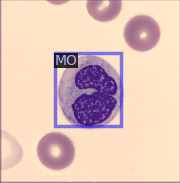

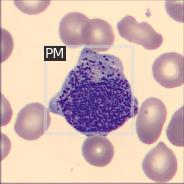

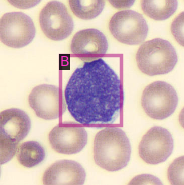

In [4]:
from google.colab.patches import cv2_imshow
from detectron2.utils.visualizer import Visualizer
import cv2
import random

# Metadata and dataset
metadata = MetadataCatalog.get("fruits_nuts_train")
dataset_dicts = DatasetCatalog.get("fruits_nuts_train")

# Visualize a few samples
for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])  # Use cv2_imshow instead of cv2.imshow


[01/23 17:56:05 d2.data.datasets.coco]: Loaded 11672 images in COCO format from /content/train_coco_annotations.json


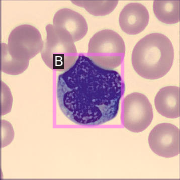

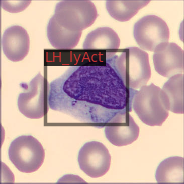

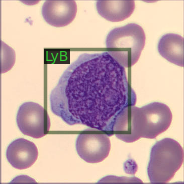

In [5]:
from google.colab.patches import cv2_imshow
from detectron2.utils.visualizer import Visualizer
import cv2
import random

# Metadata and dataset
metadata = MetadataCatalog.get("fruits_nuts_train")
dataset_dicts = DatasetCatalog.get("fruits_nuts_train")

# Visualize a few samples
for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])  # Use cv2_imshow instead of cv2.imshow


In [6]:
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
import os

cfg = get_cfg()
cfg.merge_from_file("./detectron2_repo/configs/COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
cfg.DATASETS.TRAIN = ("fruits_nuts_train",)  # Use your registered training dataset
cfg.DATASETS.TEST = ("fruits_nuts_val",)  # Use your validation dataset for evaluation
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = "detectron2://COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x/137849600/model_final_f10217.pkl"
cfg.SOLVER.IMS_PER_BATCH = 4  # Adjust based on your GPU memory (lower if OOM issues occur)
cfg.SOLVER.BASE_LR = 0.002  # Learning rate, adjust if training is unstable
cfg.SOLVER.MAX_ITER = 6000  # Number of iterations
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 23  # Number of classes in your dataset
cfg.OUTPUT_DIR = "./output"  # Output directory for model checkpoints and logs

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

# Initialize the trainer
trainer = DefaultTrainer(cfg)


[01/23 17:56:06 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

In [11]:
# Import necessary libraries
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
from detectron2.data.datasets import register_coco_instances
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
from detectron2.utils.logger import setup_logger
import os
import numpy as np

setup_logger()

# Step 1: Register the Dataset
register_coco_instances("fruits_nuts_train", {}, "/content/train_coco_annotations.json", "/content/yolo_annotations_format/train/images")
register_coco_instances("fruits_nuts_val", {}, "/content/val_coco_annotations.json", "/content/yolo_annotations_format/val/images")

# Step 2: Set Up Configuration
cfg = get_cfg()
cfg.merge_from_file("./detectron2_repo/configs/COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
cfg.DATASETS.TRAIN = ("fruits_nuts_train",)  # Training dataset
cfg.DATASETS.TEST = ("fruits_nuts_val",)  # Validation dataset
cfg.DATALOADER.NUM_WORKERS = 2  # Number of data loading workers
cfg.MODEL.WEIGHTS = "detectron2://COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x/137849600/model_final_f10217.pkl"
cfg.SOLVER.IMS_PER_BATCH = 4  # Batch size (adjust based on your GPU memory)
cfg.SOLVER.BASE_LR = 0.0025  # Learning rate
cfg.SOLVER.MAX_ITER = 7000  # Number of iterations
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128  # Batch size per image for the ROI head
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 23  # Number of classes in your dataset (update as per your dataset)
cfg.MODEL.MASK_ON = False  # Disable the mask head
cfg.OUTPUT_DIR = "./output"  # Directory to save outputs

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

# Step 3: Initialize and Start Training
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()



[01/23 18:05:41 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
  roi_heads.mask_head.mask_fcn1.{bias, weight}
  roi_heads.mask_head.mask_fcn2.{bias, weight}
  roi_heads.mask_head.mask_fcn3.{bias, weight}
  roi_heads.mask_head.mask_fcn4.{bias, weight}
  roi_heads.mask_head.deconv.{bias, weight}
  roi_heads.mask_head.predictor.{bias, weight}


[01/23 18:05:42 d2.engine.train_loop]: Starting training from iteration 0
[01/23 18:05:55 d2.utils.events]:  eta: 1:18:05  iter: 19  total_loss: 3.57  loss_cls: 2.997  loss_box_reg: 0.5447  loss_rpn_cls: 0.01479  loss_rpn_loc: 0.00483    time: 0.6636  last_time: 0.6404  data_time: 0.0300  last_data_time: 0.0255   lr: 4.9952e-05  max_mem: 5332M
[01/23 18:06:08 d2.utils.events]:  eta: 1:17:13  iter: 39  total_loss: 1.716  loss_cls: 1.144  loss_box_reg: 0.5647  loss_rpn_cls: 0.01075  loss_rpn_loc: 0.00504    time: 0.6658  last_time: 0.5591  data_time: 0.0253  last_data_time: 0.0228   lr: 9.9903e-05  max_mem: 5332M
[01/23 18:06:22 d2.utils.events]:  eta: 1:18:48  iter: 59  total_loss: 1.325  loss_cls: 0.6866  loss_box_reg: 0.6006  loss_rpn_cls: 0.008475  loss_rpn_loc: 0.00426    time: 0.6770  last_time: 0.5841  data_time: 0.0225  last_data_time: 0.0351   lr: 0.00014985  max_mem: 5332M
[01/23 18:06:36 d2.utils.events]:  eta: 1:17:53  iter: 79  total_loss: 1.402  loss_cls: 0.6978  loss_box_r

KeyError: 'AR'

In [12]:
#Step 4: Evaluate the Model
print("Starting evaluation...")
evaluator = COCOEvaluator("fruits_nuts_val", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "fruits_nuts_val")
results = inference_on_dataset(trainer.model, val_loader, evaluator)



Starting evaluation...
WARNING [01/23 19:26:00 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
[01/23 19:26:00 d2.data.datasets.coco]: Loaded 683 images in COCO format from /content/val_coco_annotations.json
[01/23 19:26:00 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[01/23 19:26:00 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[01/23 19:26:00 d2.data.common]: Serializing 683 elements to byte tensors and concatenating them all ...
[01/23 19:26:00 d2.data.common]: Serialized dataset takes 0.17 MiB
[01/23 19:26:00 d2.evaluation.evaluator]: Start inference on 683 batches
[01/23 19:26:01 d2.evaluation.evaluator]: Inference done 11/683. Dataloading: 0.0070 s/iter. Inference: 0.0988 s/iter. Eval: 0.0004 s/iter. Total: 0.106

test

In [ ]:
annotations_csv = "/content/yolo_annotations_format/val_annotations.csv"
annotations_df = pd.read_csv(annotations_csv)

In [ ]:
annotations_df = pd.read_csv(annotations_csv)


In [ ]:
annotations_df

[01/23 19:27:49 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


/usr/local/lib/python3.11/dist-packages/fvcore/common/checkpoint.py:252: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return torch.load(f, map_location=torch.device("cpu"))

Original image: 88b51619-4.jpg


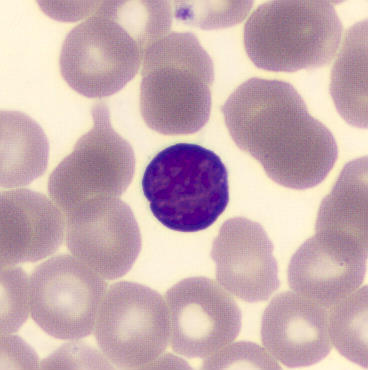

Original image with ground-truth labels: 88b51619-4.jpg


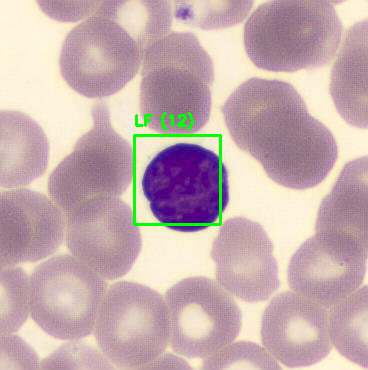

Predictions for 88b51619-4.jpg:


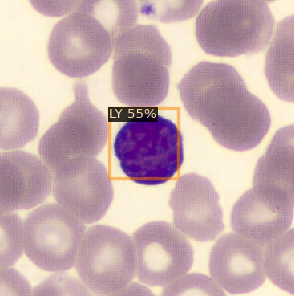

Original image: 9ab0a529-d.jpg


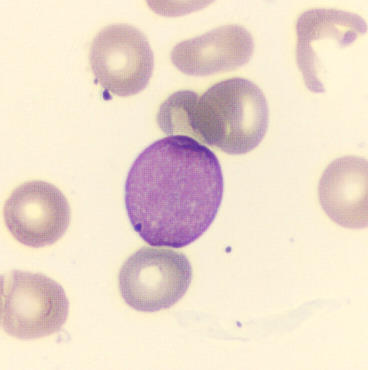

Original image with ground-truth labels: 9ab0a529-d.jpg


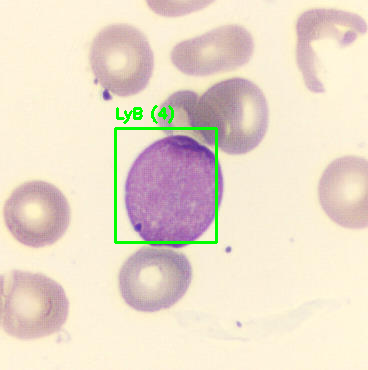

Predictions for 9ab0a529-d.jpg:


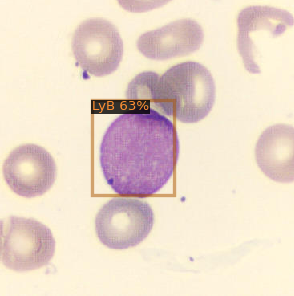

Original image: 6f609396-d.jpg


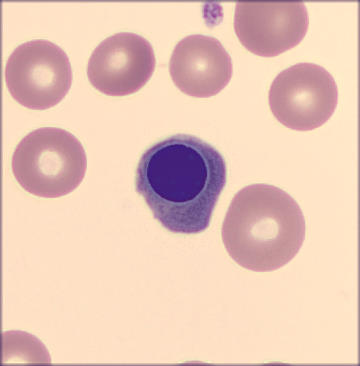

Original image with ground-truth labels: 6f609396-d.jpg


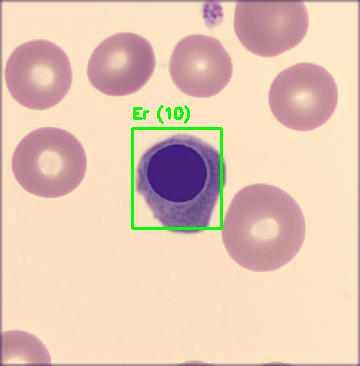

Predictions for 6f609396-d.jpg:


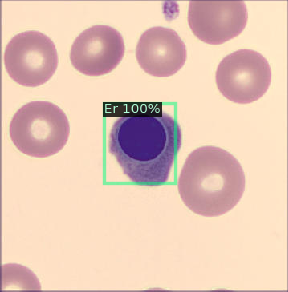

Original image: e03c1120-b.jpg


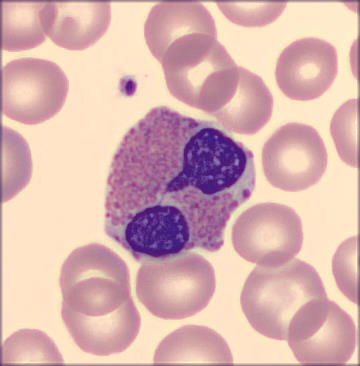

Original image with ground-truth labels: e03c1120-b.jpg


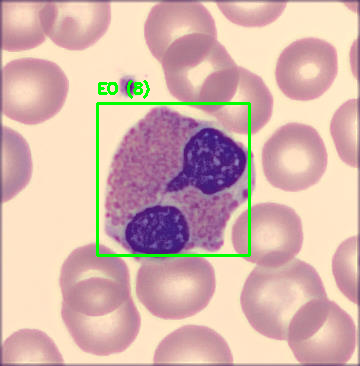

Predictions for e03c1120-b.jpg:


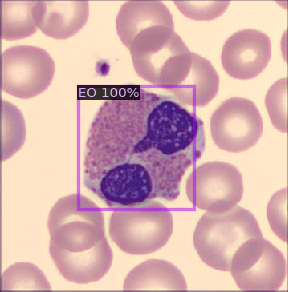

Original image: 0bf63489-7.jpg


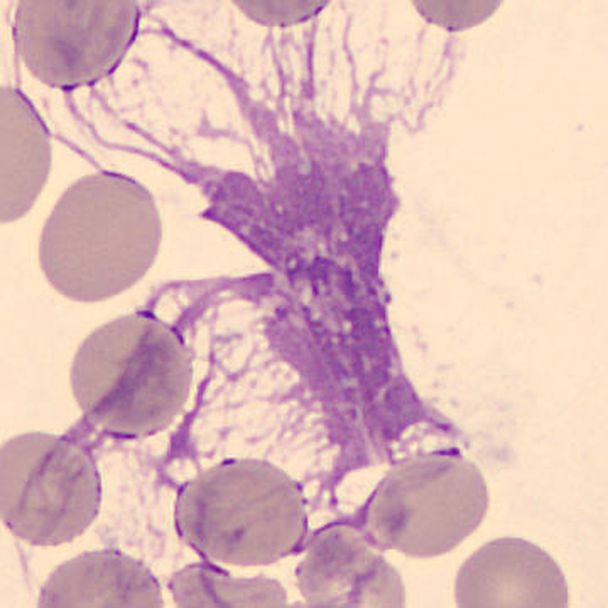

Original image with ground-truth labels: 0bf63489-7.jpg


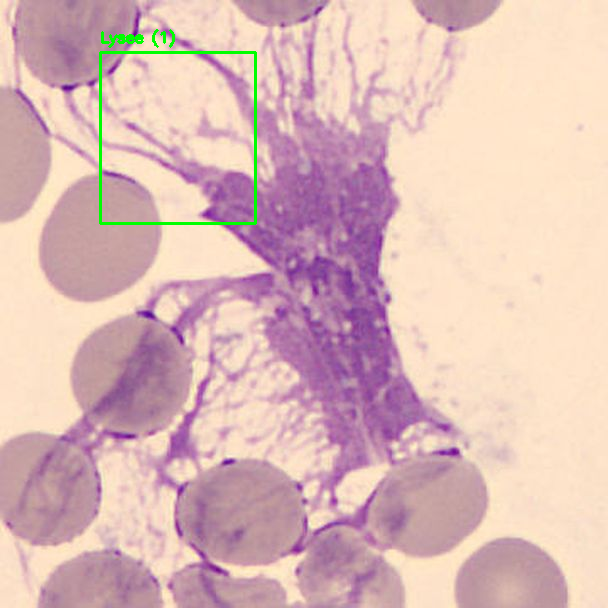

Predictions for 0bf63489-7.jpg:


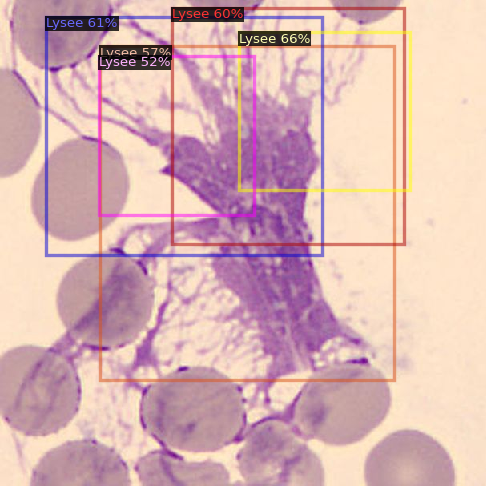

In [13]:
# Import necessary libraries
import os
import cv2
import pandas as pd
from detectron2.engine import DefaultPredictor
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog
from google.colab.patches import cv2_imshow

# Step 1: Set up the configuration
from detectron2.config import get_cfg
cfg = get_cfg()
cfg.merge_from_file("./detectron2_repo/configs/COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # Faster R-CNN config
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # Path to trained weights
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # Confidence threshold for predictions
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 23  # Number of classes in your dataset
cfg.INPUT.FORMAT = "BGR"  # Ensure input image format matches training
cfg.DATASETS.TEST = ("fruits_nuts_val",)  # Validation dataset name
cfg.MODEL.MASK_ON = False  # Disable the mask head
cfg.OUTPUT_DIR = "./output"  # Output directory for trained model

# Initialize the predictor
predictor = DefaultPredictor(cfg)

# Step 2: Load the test annotations
annotations_csv = "/content/yolo_annotations_format/test_annotations.csv"
annotations_df = pd.read_csv(annotations_csv)

# Step 3: Directory containing test images
image_dir = "/content/yolo_annotations_format/test/images"
test_images = os.listdir(image_dir)

# Helper function to draw annotations
def draw_annotations(image, annotations):
    for _, row in annotations.iterrows():
        x1, y1, x2, y2 = row["x1"], row["y1"], row["x2"], row["y2"]
        label = f"{row['class']} ({row['class_id']})"
        # Draw bounding box
        cv2.rectangle(image, (int(x1), int(y1)), (int(x2), int(y2)), (0, 255, 0), 2)
        # Put label text
        cv2.putText(image, label, (int(x1), int(y1) - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
    return image

# Step 4: Visualize test images
for image_name in test_images[:5]:  # Visualize first 5 images for brevity
    image_path = os.path.join(image_dir, image_name)

    # Load the image
    image = cv2.imread(image_path)

    # Extract annotations for this image
    image_annotations = annotations_df[annotations_df["NAME"] == image_name]

    # Original image
    print(f"Original image: {image_name}")
    cv2_imshow(image)

    # Original image with labels from the CSV
    if not image_annotations.empty:
        original_with_labels = draw_annotations(image.copy(), image_annotations)
        print(f"Original image with ground-truth labels: {image_name}")
        cv2_imshow(original_with_labels)
    else:
        print(f"No ground-truth annotations found for: {image_name}")

    # Perform inference
    outputs = predictor(image)

    # Visualize predictions
    v = Visualizer(image[:, :, ::-1], metadata=MetadataCatalog.get("fruits_nuts_train"), scale=0.8)
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    print(f"Predictions for {image_name}:")
    cv2_imshow(v.get_image()[:, :, ::-1])


In [ ]:
# Helper function to clean and match labels
def clean_label(label):
    # Extract the core label (e.g., "EO" from "EO (5)")
    return label.split('(')[0].strip()

# Update the function to draw annotations
def draw_annotations(image, annotations):
    for _, row in annotations.iterrows():
        x1, y1, x2, y2 = row["x1"], row["y1"], row["x2"], row["y2"]
        core_label = clean_label(row["class"])  # Clean ground truth label
        label = f"{core_label} ({row['class_id']})"
        # Draw bounding box
        cv2.rectangle(image, (int(x1), int(y1)), (int(x2), int(y2)), (0, 255, 0), 2)
        # Put label text
        cv2.putText(image, label, (int(x1), int(y1) - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
    return image

# Update the inference and comparison logic
for image_name in test_images[:5]:  # Visualize first 5 images for brevity
    image_path = os.path.join(image_dir, image_name)

    # Load the image
    image = cv2.imread(image_path)

    # Extract annotations for this image
    image_annotations = annotations_df[annotations_df["NAME"] == image_name]

    # Original image
    print(f"Original image: {image_name}")
    cv2_imshow(image)

    # Original image with labels from the CSV
    if not image_annotations.empty:
        original_with_labels = draw_annotations(image.copy(), image_annotations)
        print(f"Original image with ground-truth labels: {image_name}")
        cv2_imshow(original_with_labels)
    else:
        print(f"No ground-truth annotations found for: {image_name}")

    # Perform inference
    outputs = predictor(image)

    # Map predicted class labels for comparison
    predicted_instances = outputs["instances"].to("cpu")
    predicted_classes = predicted_instances.pred_classes.numpy()  # Get class indices
    predicted_boxes = predicted_instances.pred_boxes.tensor.numpy()

    # Visualize predictions
    v = Visualizer(image[:, :, ::-1], metadata=MetadataCatalog.get("fruits_nuts_train"), scale=0.8)
    v = v.draw_instance_predictions(predicted_instances)
    print(f"Predictions for {image_name}:")
    cv2_imshow(v.get_image()[:, :, ::-1])

    # Clean and compare predictions with ground truth
    for pred_class, pred_box in zip(predicted_classes, predicted_boxes):
        predicted_label = MetadataCatalog.get("fruits_nuts_train").thing_classes[pred_class]
        predicted_label_clean = clean_label(predicted_label)

        # Compare with cleaned ground truth labels (implement your comparison logic here)
        print(f"Predicted: {predicted_label_clean}, Ground Truth: {image_annotations['class'].tolist()}")


Original image: 88b51619-4.jpg


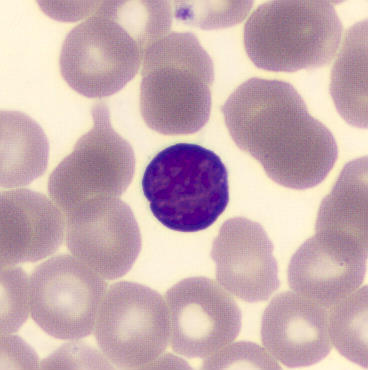

Original image with ground-truth labels: 88b51619-4.jpg


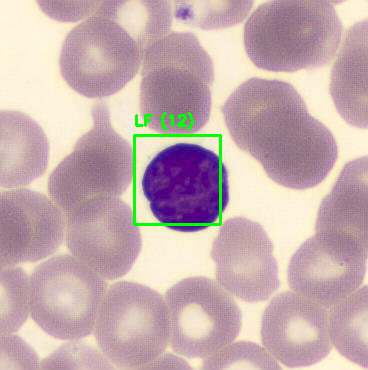

Predictions for 88b51619-4.jpg:


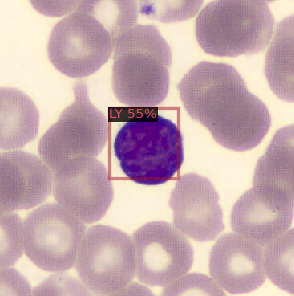

Predicted: LY, Ground Truth: ['LF']
Original image: 9ab0a529-d.jpg


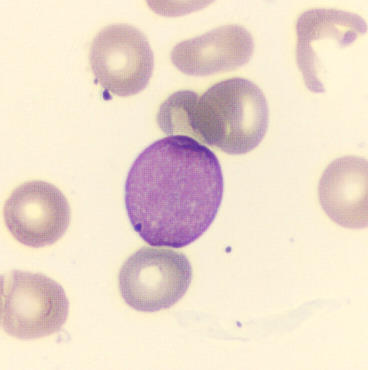

Original image with ground-truth labels: 9ab0a529-d.jpg


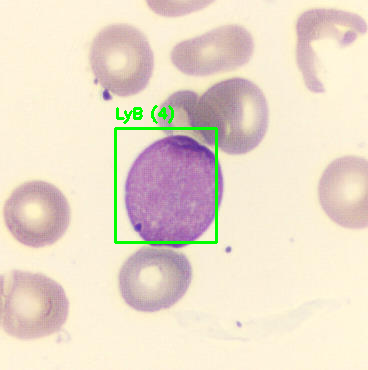

Predictions for 9ab0a529-d.jpg:


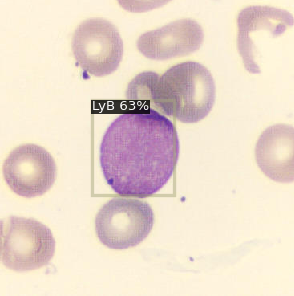

Predicted: LyB, Ground Truth: ['LyB']
Original image: 6f609396-d.jpg


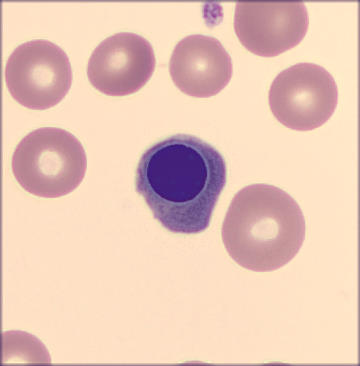

Original image with ground-truth labels: 6f609396-d.jpg


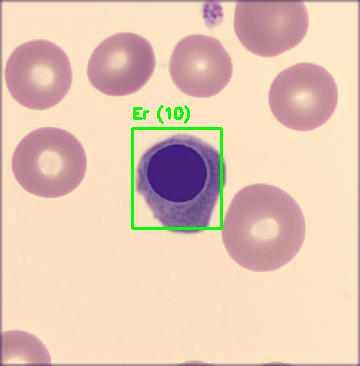

Predictions for 6f609396-d.jpg:


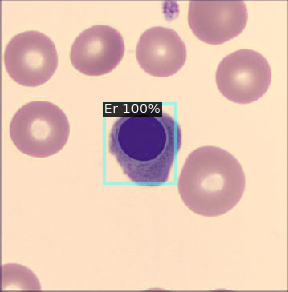

Predicted: Er, Ground Truth: ['Er']
Original image: e03c1120-b.jpg


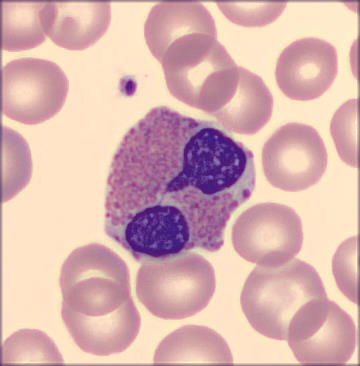

Original image with ground-truth labels: e03c1120-b.jpg


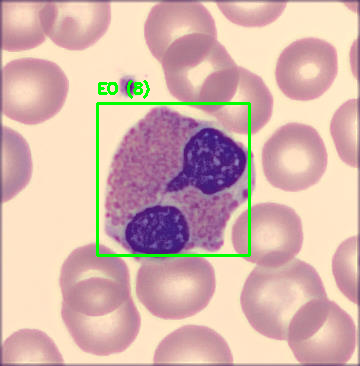

Predictions for e03c1120-b.jpg:


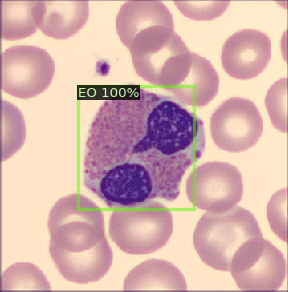

Predicted: EO, Ground Truth: ['EO']
Original image: 0bf63489-7.jpg


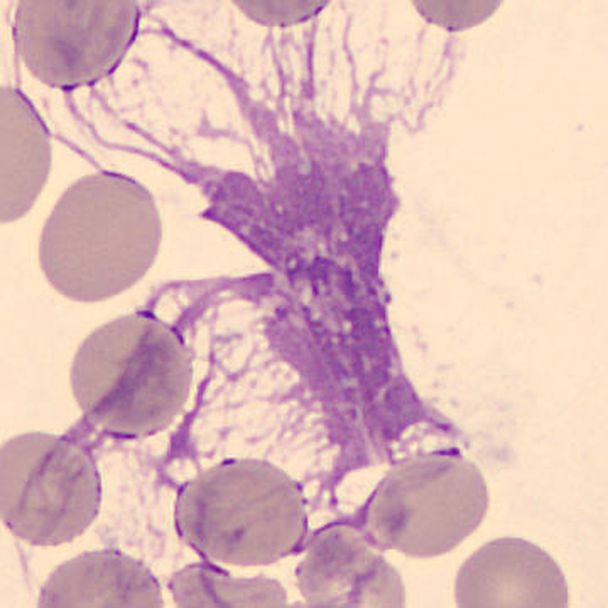

Original image with ground-truth labels: 0bf63489-7.jpg


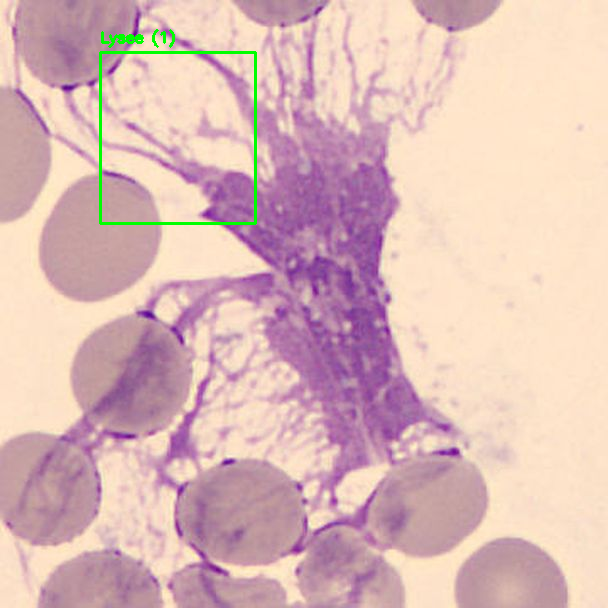

Predictions for 0bf63489-7.jpg:


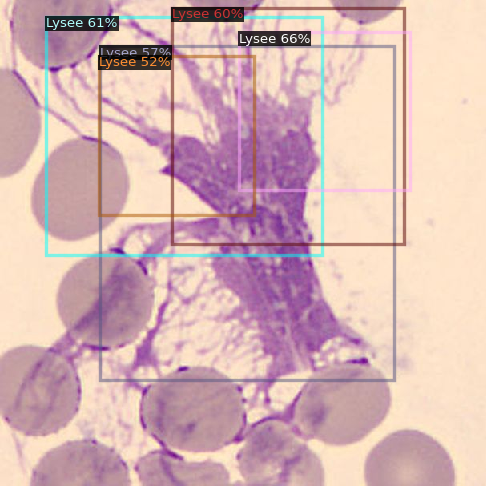

Predicted: Lysee, Ground Truth: ['Lysee']
Predicted: Lysee, Ground Truth: ['Lysee']
Predicted: Lysee, Ground Truth: ['Lysee']
Predicted: Lysee, Ground Truth: ['Lysee']
Predicted: Lysee, Ground Truth: ['Lysee']


In [17]:
# Helper function to clean and match labels
def clean_label(label):
    # Extract the core label (e.g., "EO" from "EO (5)")
    return label.split('(')[0].strip()

# Update the function to draw annotations
def draw_annotations(image, annotations):
    for _, row in annotations.iterrows():
        x1, y1, x2, y2 = row["x1"], row["y1"], row["x2"], row["y2"]
        core_label = clean_label(row["class"])  # Clean ground truth label
        label = f"{core_label} ({row['class_id']})"
        # Draw bounding box
        cv2.rectangle(image, (int(x1), int(y1)), (int(x2), int(y2)), (0, 255, 0), 2)
        # Put label text
        cv2.putText(image, label, (int(x1), int(y1) - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
    return image

# Update the inference and comparison logic
for image_name in test_images[:5]:  # Visualize first 5 images for brevity
    image_path = os.path.join(image_dir, image_name)

    # Load the image
    image = cv2.imread(image_path)

    # Extract annotations for this image
    image_annotations = annotations_df[annotations_df["NAME"] == image_name]

    # Original image
    print(f"Original image: {image_name}")
    cv2_imshow(image)

    # Original image with labels from the CSV
    if not image_annotations.empty:
        original_with_labels = draw_annotations(image.copy(), image_annotations)
        print(f"Original image with ground-truth labels: {image_name}")
        cv2_imshow(original_with_labels)
    else:
        print(f"No ground-truth annotations found for: {image_name}")

    # Perform inference
    outputs = predictor(image)

    # Map predicted class labels for comparison
    predicted_instances = outputs["instances"].to("cpu")
    predicted_classes = predicted_instances.pred_classes.numpy()  # Get class indices
    predicted_boxes = predicted_instances.pred_boxes.tensor.numpy()

    # Visualize predictions
    v = Visualizer(image[:, :, ::-1], metadata=MetadataCatalog.get("fruits_nuts_train"), scale=0.8)
    v = v.draw_instance_predictions(predicted_instances)
    print(f"Predictions for {image_name}:")
    cv2_imshow(v.get_image()[:, :, ::-1])

    # Clean and compare predictions with ground truth
    for pred_class, pred_box in zip(predicted_classes, predicted_boxes):
        predicted_label = MetadataCatalog.get("fruits_nuts_train").thing_classes[pred_class]
        predicted_label_clean = clean_label(predicted_label)

        # Compare with cleaned ground truth labels (implement your comparison logic here)
        print(f"Predicted: {predicted_label_clean}, Ground Truth: {image_annotations['class'].tolist()}")


In [21]:
# Helper function to clean and match labels
def clean_label(label):
    """Clean label to remove numbers or extra information after parentheses."""
    # Remove anything within parentheses, including the parentheses
    return label.split('(')[0].strip()

# Update the function to draw annotations
def draw_annotations(image, annotations):
    """Draw bounding boxes and clean labels on the image."""
    for _, row in annotations.iterrows():
        x1, y1, x2, y2 = row["x1"], row["y1"], row["x2"], row["y2"]
        core_label = clean_label(row["class"])  # Clean ground truth label
        label = f"{core_label} ({row['class_id']})"
        # Draw bounding box
        cv2.rectangle(image, (int(x1), int(y1)), (int(x2), int(y2)), (0, 255, 0), 2)
        # Put label text
        cv2.putText(image, label, (int(x1), int(y1) - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
    return image

# Accuracy Calculation with Fix
def compare_labels(predicted_classes, predicted_boxes, ground_truth_annotations, metadata):
    """Compare predicted labels with ground truth and calculate accuracy."""
    if ground_truth_annotations.empty:
        print("No ground truth annotations found. Returning accuracy of 0.")
        return 0

    correct_predictions = 0
    total_predictions = len(predicted_classes)

    for pred_class, pred_box in zip(predicted_classes, predicted_boxes):
        # Predicted label (cleaned)
        predicted_label = metadata.thing_classes[pred_class]
        predicted_label_clean = clean_label(predicted_label)

        # Ground truth labels (cleaned)
        ground_truth_labels = [clean_label(gt_label) for gt_label in ground_truth_annotations['class'].tolist()]

        # Compare predicted label with ground truth labels
        if predicted_label_clean in ground_truth_labels:
            correct_predictions += 1

    accuracy = correct_predictions / total_predictions if total_predictions > 0 else 0
    return accuracy

# F1 Score Calculation with Fix
def calculate_f1_score(predicted_classes, ground_truth_annotations, metadata):
    """Calculate F1 Score based on predictions and ground truth."""
    from sklearn.metrics import f1_score

    # Check if ground truth is empty
    if ground_truth_annotations.empty:
        print("No ground truth annotations found. Returning F1 score of 0.")
        return 0

    # Clean and align ground truth labels
    ground_truth_labels = [clean_label(gt_label) for gt_label in ground_truth_annotations['class'].tolist()]

    # Clean and align predicted labels
    predicted_labels = [clean_label(metadata.thing_classes[pred_class]) for pred_class in predicted_classes]

    # Ensure lists are non-empty
    if len(predicted_labels) == 0 or len(ground_truth_labels) == 0:
        print("Empty predicted or ground truth labels. Returning F1 score of 0.")
        return 0

    # Use sklearn to calculate F1 Score
    f1 = f1_score(ground_truth_labels, predicted_labels, average='weighted', zero_division=0)
    return f1

# Example usage
# Assuming you have:
# - `outputs`: Model predictions
# - `annotations_df`: Ground truth annotations
# - `metadata`: Metadata with class labels
outputs = predictor(image)
predicted_instances = outputs["instances"].to("cpu")
predicted_classes = predicted_instances.pred_classes.numpy()
predicted_boxes = predicted_instances.pred_boxes.tensor.numpy()

ground_truth_annotations = annotations_df[annotations_df["NAME"] == image_name]

# Calculate accuracy
accuracy = compare_labels(predicted_classes, predicted_boxes, ground_truth_annotations, MetadataCatalog.get("your_dataset"))

# Calculate F1 score
f1 = calculate_f1_score(predicted_classes, ground_truth_annotations, MetadataCatalog.get("your_dataset"))

print(f"Accuracy: {accuracy:.2f}")
print(f"F1 Score: {f1:.2f}")

Empty predicted or ground truth labels. Returning F1 score of 0.
Accuracy: 0.00
F1 Score: 0.00


In [22]:
print("Predicted Classes:", predicted_classes)
print("Number of Predictions:", len(predicted_classes))


Predicted Classes: []
Number of Predictions: 0


In [23]:
print("Image Shape:", image.shape)


Image Shape: (366, 360, 3)


[01/23 19:46:28 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


/usr/local/lib/python3.11/dist-packages/fvcore/common/checkpoint.py:252: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return torch.load(f, map_location=torch.device("cpu"))

Original image: 88b51619-4.jpg


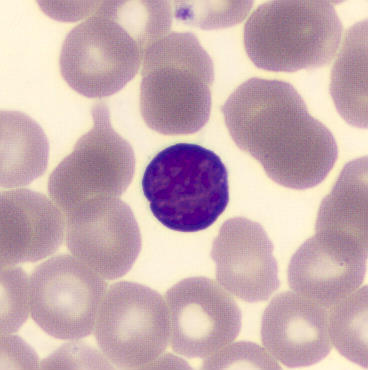

Original image with ground-truth labels: 88b51619-4.jpg


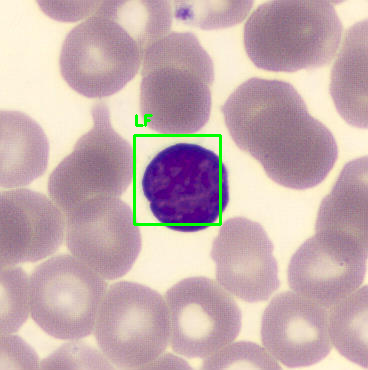

Predictions for 88b51619-4.jpg:


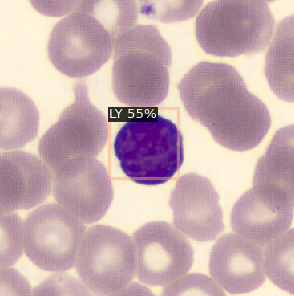

Original image: 9ab0a529-d.jpg


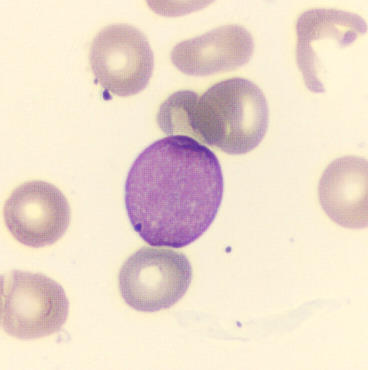

Original image with ground-truth labels: 9ab0a529-d.jpg


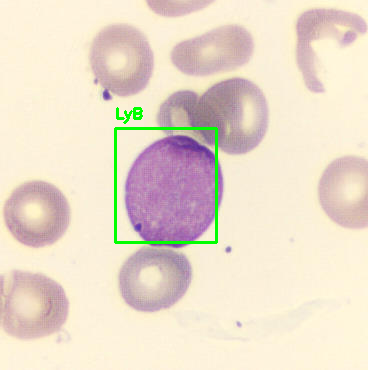

Predictions for 9ab0a529-d.jpg:


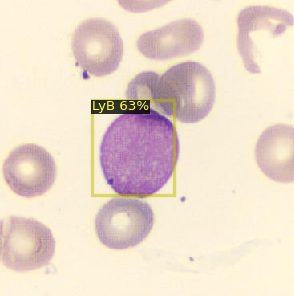

Original image: 6f609396-d.jpg


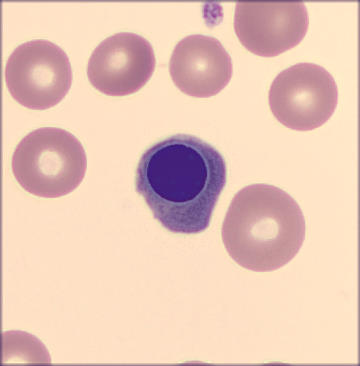

Original image with ground-truth labels: 6f609396-d.jpg


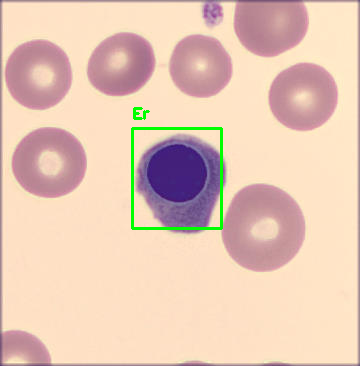

Predictions for 6f609396-d.jpg:


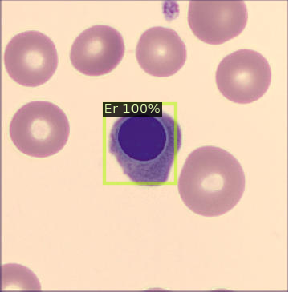

Original image: e03c1120-b.jpg


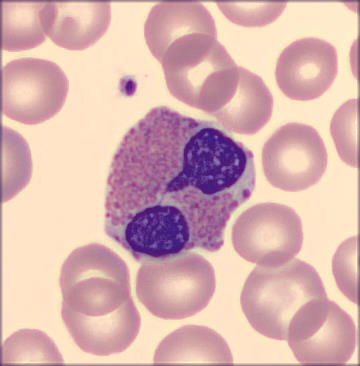

Original image with ground-truth labels: e03c1120-b.jpg


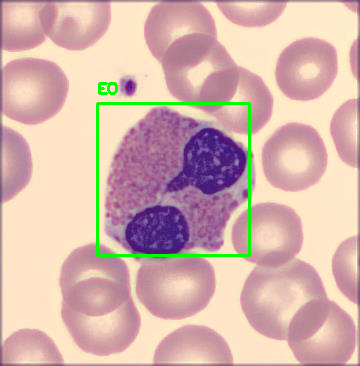

Predictions for e03c1120-b.jpg:


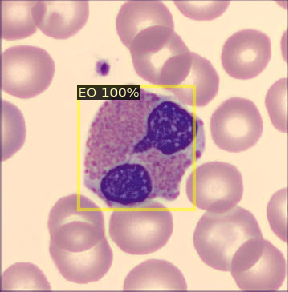

Original image: 0bf63489-7.jpg


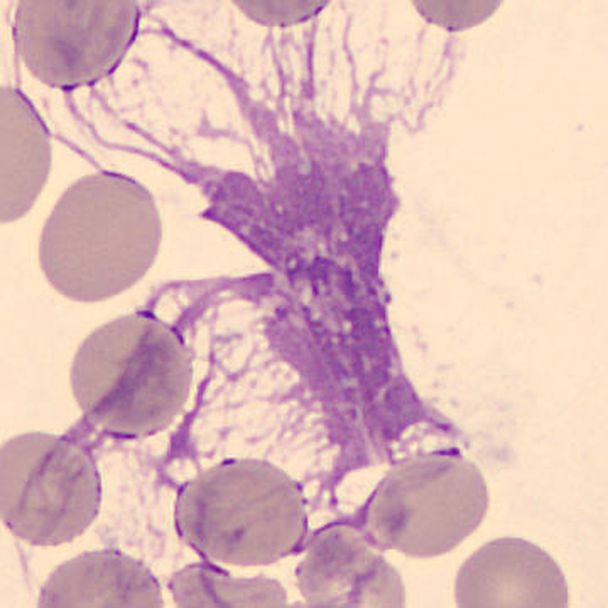

Original image with ground-truth labels: 0bf63489-7.jpg


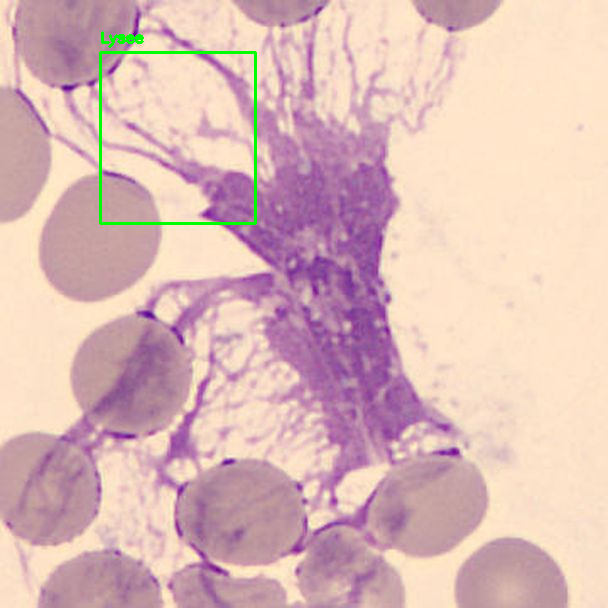

Predictions for 0bf63489-7.jpg:


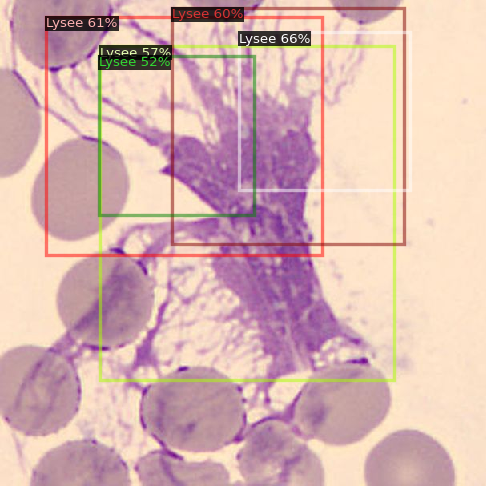

In [25]:
# Import necessary libraries
import os
import cv2
import pandas as pd
from detectron2.engine import DefaultPredictor
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog
from google.colab.patches import cv2_imshow

# Step 1: Set up the configuration
from detectron2.config import get_cfg
cfg = get_cfg()
cfg.merge_from_file("./detectron2_repo/configs/COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # Faster R-CNN config
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # Path to trained weights
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # Confidence threshold for predictions
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 23  # Number of classes in your dataset
cfg.INPUT.FORMAT = "BGR"  # Ensure input image format matches training
cfg.DATASETS.TEST = ("fruits_nuts_val",)  # Validation dataset name
cfg.MODEL.MASK_ON = False  # Disable the mask head
cfg.OUTPUT_DIR = "./output"  # Output directory for trained model

# Initialize the predictor
predictor = DefaultPredictor(cfg)

# Step 2: Load the test annotations
annotations_csv = "/content/yolo_annotations_format/test_annotations.csv"
annotations_df = pd.read_csv(annotations_csv)

# Step 3: Directory containing test images
image_dir = "/content/yolo_annotations_format/test/images"
test_images = os.listdir(image_dir)

# Helper function to draw annotations
# Helper function to draw annotations
def draw_annotations(image, annotations):
    for _, row in annotations.iterrows():
        x1, y1, x2, y2 = row["x1"], row["y1"], row["x2"], row["y2"]
        # Extract the label without parentheses content
        label = row['class'].split('(')[0].strip()  # Keep only the portion before '('
        # Draw bounding box
        cv2.rectangle(image, (int(x1), int(y1)), (int(x2), int(y2)), (0, 255, 0), 2)
        # Put label text
        cv2.putText(image, label, (int(x1), int(y1) - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
    return image


# Step 4: Visualize test images
for image_name in test_images[:5]:  # Visualize first 5 images for brevity
    image_path = os.path.join(image_dir, image_name)

    # Load the image
    image = cv2.imread(image_path)

    # Extract annotations for this image
    image_annotations = annotations_df[annotations_df["NAME"] == image_name]

    # Original image
    print(f"Original image: {image_name}")
    cv2_imshow(image)

    # Original image with labels from the CSV
    if not image_annotations.empty:
        original_with_labels = draw_annotations(image.copy(), image_annotations)
        print(f"Original image with ground-truth labels: {image_name}")
        cv2_imshow(original_with_labels)
    else:
        print(f"No ground-truth annotations found for: {image_name}")

    # Perform inference
    outputs = predictor(image)

    # Visualize predictions
    v = Visualizer(image[:, :, ::-1], metadata=MetadataCatalog.get("fruits_nuts_train"), scale=0.8)
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    print(f"Predictions for {image_name}:")
    cv2_imshow(v.get_image()[:, :, ::-1])


In [27]:
import pandas as pd
import os
import cv2
from detectron2.data import MetadataCatalog

# Step 2: Load the test annotations
annotations_csv = "/content/yolo_annotations_format/test_annotations.csv"
annotations_df = pd.read_csv(annotations_csv)

# Step 3: Directory containing test images
image_dir = "/content/yolo_annotations_format/test/images"
test_images = os.listdir(image_dir)

# Initialize result storage
results = []

# Process each test image
for image_name in test_images:
    image_path = os.path.join(image_dir, image_name)

    # Load the image
    image = cv2.imread(image_path)

    # Extract ground truth annotations for this image
    ground_truth = annotations_df[annotations_df["NAME"] == image_name]

    # Get model predictions
    outputs = predictor(image)
    predictions = outputs["instances"].to("cpu")
    pred_classes = predictions.pred_classes.numpy()

    # Map predicted class IDs to class names
    pred_class_names = [
        MetadataCatalog.get("fruits_nuts_train").thing_classes[class_id]
        for class_id in pred_classes
    ]

    # For simplicity, compare the first ground truth class and the first predicted class
    if not ground_truth.empty:
        gt_classes = [
            row["class"].split('(')[0].strip() for _, row in ground_truth.iterrows()
        ]
    else:
        gt_classes = []

    if gt_classes and pred_class_names:
        # Compare each ground truth class to predicted class (one-to-one mapping)
        for gt_class, pred_class in zip(gt_classes, pred_class_names):
            results.append(
                {
                    "Image Name": image_name,
                    "Ground Truth Class": gt_class,
                    "Predicted Class": pred_class,
                }
            )
    elif gt_classes:  # Ground truth exists but no prediction
        for gt_class in gt_classes:
            results.append(
                {
                    "Image Name": image_name,
                    "Ground Truth Class": gt_class,
                    "Predicted Class": "none",
                }
            )
    elif pred_class_names:  # Predictions exist but no ground truth
        for pred_class in pred_class_names:
            results.append(
                {
                    "Image Name": image_name,
                    "Ground Truth Class": "none",
                    "Predicted Class": pred_class,
                }
            )

# Save results to CSV
results_df = pd.DataFrame(results)
results_csv_path = "/content/results.csv"
results_df.to_csv(results_csv_path, index=False)

# Calculate accuracy
correct_predictions = sum(
    1
    for result in results
    if result["Ground Truth Class"] == result["Predicted Class"]
)
accuracy = correct_predictions / len(results) if results else 0

print(f"Accuracy: {accuracy:.4f}")
print(f"Results saved to {results_csv_path}")


Accuracy: 0.6116
Results saved to /content/results.csv


In [28]:
import pandas as pd
import os
import cv2
from detectron2.data import MetadataCatalog

# Step 2: Load the test annotations
annotations_csv = "/content/yolo_annotations_format/test_annotations.csv"
annotations_df = pd.read_csv(annotations_csv)

# Step 3: Directory containing test images
image_dir = "/content/yolo_annotations_format/test/images"
test_images = os.listdir(image_dir)

# Initialize result storage
results = []

# Process each test image
for image_name in test_images:
    image_path = os.path.join(image_dir, image_name)

    # Load the image
    image = cv2.imread(image_path)

    # Extract ground truth annotations for this image
    ground_truth = annotations_df[annotations_df["NAME"] == image_name]

    # Get model predictions
    outputs = predictor(image)
    predictions = outputs["instances"].to("cpu")
    pred_classes = predictions.pred_classes.numpy()

    # Map predicted class IDs to class names
    pred_class_names = [
        MetadataCatalog.get("fruits_nuts_train").thing_classes[class_id]
        for class_id in pred_classes
    ]

    # Combine all ground truth classes for this image
    if not ground_truth.empty:
        gt_classes = set(
            row["class"].split('(')[0].strip() for _, row in ground_truth.iterrows()
        )
    else:
        gt_classes = set()

    # Combine all predicted classes for this image
    pred_class_names = set(pred_class_names)

    # Store the results for this image
    results.append(
        {
            "Image Name": image_name,
            "Ground Truth Classes": ", ".join(gt_classes),
            "Predicted Classes": ", ".join(pred_class_names),
            "Correct Prediction": gt_classes == pred_class_names,
        }
    )

# Save results to CSV
results_df = pd.DataFrame(results)
results_csv_path = "/content/results.csv"
results_df.to_csv(results_csv_path, index=False)

# Calculate accuracy
correct_predictions = sum(1 for result in results if result["Correct Prediction"])
accuracy = correct_predictions / len(results) if results else 0

print(f"Accuracy: {accuracy:.4f}")
print(f"Results saved to {results_csv_path}")


Accuracy: 0.5379
Results saved to /content/results.csv


In [31]:
import pandas as pd
import os
import cv2
from detectron2.data import MetadataCatalog

# Step 2: Load the test annotations
annotations_csv = "/content/yolo_annotations_format/test_annotations.csv"
annotations_df = pd.read_csv(annotations_csv)

# Step 3: Directory containing test images
image_dir = "/content/yolo_annotations_format/test/images"
test_images = os.listdir(image_dir)

# Initialize result storage
results = []

# Process each test image
for image_name in test_images:
    image_path = os.path.join(image_dir, image_name)

    # Load the image
    image = cv2.imread(image_path)

    # Extract ground truth annotations for this image and group classes
    ground_truth = annotations_df[annotations_df["NAME"] == image_name]
    if not ground_truth.empty:
        gt_classes = set(
            row["class"].split('(')[0].strip() for _, row in ground_truth.iterrows()
        )
    else:
        gt_classes = set()

    # Get model predictions
    outputs = predictor(image)
    predictions = outputs["instances"].to("cpu")
    pred_classes = predictions.pred_classes.numpy()

    # Map predicted class IDs to class names and group them
    pred_class_names = set(
        MetadataCatalog.get("fruits_nuts_train").thing_classes[class_id]
        for class_id in pred_classes
    )

    # Store the results for this image
    results.append(
        {
            "Image Name": image_name,
            "Ground Truth Classes": ", ".join(gt_classes),
            "Predicted Classes": ", ".join(pred_class_names),
            "Correct Prediction": gt_classes == pred_class_names,
        }
    )

# Save results to CSV
results_df = pd.DataFrame(results)
results_csv_path = "/content/results.csv"
results_df.to_csv(results_csv_path, index=False)

# Calculate accuracy
correct_predictions = sum(1 for result in results if result["Correct Prediction"])
accuracy = correct_predictions / len(results) if results else 0

print(f"Accuracy: {accuracy:.4f}")
print(f"Results saved to {results_csv_path}")


Accuracy: 0.5379
Results saved to /content/results.csv


In [32]:
import pandas as pd

# Load the results CSV
results_csv_path = "/content/results.csv"
results_df = pd.read_csv(results_csv_path)

# Check for duplicate image names
duplicate_counts = results_df["Image Name"].value_counts()
duplicates = duplicate_counts[duplicate_counts > 1]

# Output results
if not duplicates.empty:
    print("The following image names appear more than once:")
    print(duplicates)
else:
    print("All image names are unique.")


All image names are unique.


In [33]:
import pandas as pd

# Load the results CSV
results_csv_path = "/content/yolo_annotations_format/test_annotations.csv"
results_df = pd.read_csv(results_csv_path)



In [34]:
results_df

,NAME,x1,y1,x2,y2,class,class_id
0,619a07e8-3.jpg,135,132,221,229,Er,10
1,5cc1db78-0.jpg,104,100,249,258,MM,15
2,967148ef-2.jpg,57,155,206,292,MBL,6
3,1c2d6f64-d.jpg,108,104,246,255,LH_lyAct,16
4,689cf9cc-9.jpg,131,129,223,232,Er,10
...,...,...,...,...,...,...,...
685,c9727728-8.jpg,133,150,220,242,Thromb,9
686,5c704bd3-4.jpg,84,91,266,268,LAM3,2
687,ac344881-3.jpg,122,115,231,229,LZMG,21
688,35ef6327-e.jpg,92,98,260,259,B,11


In [35]:
# Check for duplicate image names
duplicate_counts = results_df["NAME"].value_counts()
duplicates = duplicate_counts[duplicate_counts > 1]

# Output results
if not duplicates.empty:
    print("The following image names appear more than once:")
    print(duplicates)
else:
    print("All image names are unique.")


The following image names appear more than once:
NAME
41facee1-6.jpg    2
c57e0eb2-b.jpg    2
1c3e5f4b-f.jpg    2
320aebad-4.jpg    2
Name: count, dtype: int64


In [36]:
import pandas as pd
import os
import cv2
from detectron2.data import MetadataCatalog

# Step 2: Load the test annotations
annotations_csv = "/content/yolo_annotations_format/train_annotations.csv"
annotations_df = pd.read_csv(annotations_csv)

# Step 3: Directory containing test images
image_dir = "/content/yolo_annotations_format/train/images"
test_images = os.listdir(image_dir)

# Initialize result storage
results = []

# Process each test image
for image_name in test_images:
    image_path = os.path.join(image_dir, image_name)

    # Load the image
    image = cv2.imread(image_path)

    # Extract ground truth annotations for this image and group classes
    ground_truth = annotations_df[annotations_df["NAME"] == image_name]
    if not ground_truth.empty:
        gt_classes = set(
            row["class"].split('(')[0].strip() for _, row in ground_truth.iterrows()
        )
    else:
        gt_classes = set()

    # Get model predictions
    outputs = predictor(image)
    predictions = outputs["instances"].to("cpu")
    pred_classes = predictions.pred_classes.numpy()

    # Map predicted class IDs to class names and group them
    pred_class_names = set(
        MetadataCatalog.get("fruits_nuts_train").thing_classes[class_id]
        for class_id in pred_classes
    )

    # Store the results for this image
    results.append(
        {
            "Image Name": image_name,
            "Ground Truth Classes": ", ".join(gt_classes),
            "Predicted Classes": ", ".join(pred_class_names),
            "Correct Prediction": gt_classes == pred_class_names,
        }
    )

# Save results to CSV
results_df = pd.DataFrame(results)
results_csv_path = "/content/results.csv"
results_df.to_csv(results_csv_path, index=False)

# Calculate accuracy
correct_predictions = sum(1 for result in results if result["Correct Prediction"])
accuracy = correct_predictions / len(results) if results else 0

print(f"Accuracy: {accuracy:.4f}")
print(f"Results saved to {results_csv_path}")


Accuracy: 0.5788
Results saved to /content/results.csv
